# Insurance Claim Fraud Detection is a classification Model

In [1]:
print(('*'*127))
print("                                                      Insurance Claim Fraud Detection                                                                 ")
print(('*'*127))

*******************************************************************************************************************************
                                                      Insurance Claim Fraud Detection                                                                 
*******************************************************************************************************************************


In [2]:
import pandas as pd
import numpy as np
import seaborn as sn


from matplotlib import pyplot as plt
import warnings
warnings.filterwarnings('ignore')

df=pd.read_csv("https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv")

pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 40)


df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
5,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,478456,FEMALE,PhD,tech-support,bungie-jumping,unmarried,0,0,02-01-2015,Multi-vehicle Collision,Rear Collision,Major Damage,Fire,SC,Arlington,8973 Washington St,19,3,NO,0,2,NO,64100,6410,6410,51280,Saab,95,2003,Y,NaN
6,137,34,413978,04-06-2000,IN,250/500,1000,1333.35,0,441716,MALE,PhD,prof-specialty,board-games,husband,0,-77000,13-01-2015,Multi-vehicle Collision,Front Collision,Minor Damage,Police,NY,Springfield,5846 Weaver Drive,0,3,?,0,0,?,78650,21450,7150,50050,Nissan,Pathfinder,2012,N,NaN
7,165,37,429027,03-02-1990,IL,100/300,1000,1137.03,0,603195,MALE,Associate,tech-support,base-jumping,unmarried,0,0,27-02-2015,Multi-vehicle Collision,Front Collision,Total Loss,Police,VA,Columbus,3525 3rd Hwy,23,3,?,2,2,YES,51590,9380,9380,32830,Audi,A5,2015,N,NaN
8,27,33,485665,05-02-1997,IL,100/300,500,1442.99,0,601734,FEMALE,PhD,other-service,golf,own-child,0,0,30-01-2015,Single Vehicle Collision,Front Collision,Total Loss,Police,WV,Arlington,4872 Rock Ridge,21,1,NO,1,1,YES,27700,2770,2770,22160,Toyota,Camry,2012,N,NaN
9,212,42,636550,25-07-2011,IL,100/300,500,1315.68,0,600983,MALE,PhD,priv-house-serv,camping,wife,0,-39300,05-01-2015,Single Vehicle Collision,Rear Collision,Total Loss,Other,NC,Hillsdale,3066 Francis Ave,14,1,NO,2,1,?,42300,4700,4700,32900,Saab,92x,1996,N,NaN


In [3]:
df.shape

(1000, 40)

* Here we that there is 1000 Rows and 40 Columns for this Dataset

In [4]:
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

* Here we observe that majority of the Columns are of Object-type and our Target variable is fraud_reported

In [5]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

* Here we observe that _c39 columns is completely NaN so we remove it

# Dataset Descirption

Insurance fraud is a huge problem in the industry. This dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not.

Insurance frauds cover the range of improper activities which an individual may commit in order to achieve a favorable outcome from the insurance company. This could range from staging the incident, misrepresenting the situation including the relevant actors and the cause of incident and finally the extent of damage caused.

The insurance industry has grappled with the challenge of insurance claim fraud from the very start. On one hand, there is the challenge of impact to customer satisfaction through delayed payouts or prolonged investigation during a period of stress. Additionally, there are costs of investigation and pressure from insurance industry regulators. On the other hand, improper payouts cause a hit to profitability and encourage similar delinquent behavior from other policy holders.

# Attributes

The Following are the attributes which signifies the fradulent prediction of the Insurance claims:

*  (1) months_as_customer : The duration of the customer giving geniune business to the company
    
*  (2) age : The respective age of the customer 

*  (3) policy_number : The given policy Number
    
*  (4) policy_bind_date : The policy bind date is the document that is given to you after we accept your proposal for insurance on that particular date
    
*  (5) policy_state : Rights and structure are the principal elements of government that historically constrained policy and protected other forms of rule. 
    
*  (6) policy_csl : your policy may list your liability limit
    
*  (7) policy_deductable : Deductible is the amount that a policy holder has to pay before the insurance company starts paying up.
    
*  (8) policy_annual_premium : Annual Premium means the amount of Regular Premium payable by the Policyholder in a Policy Year.
    
*  (9) umbrella_limit : An umbrella insurance policy is extra liability insurance coverage that goes beyond the limits of the insured amount
    
*  (10) insured_zip : ZIP is an acronym for Zone Improvement Plan.
     
*  (11) insured_sex : The gender of that individual who has been insured
    
*  (12) insured_education_level : The gender of that individuals education level who has been insured
    
*  (13) insured_occupation : The kind of Occupation therey possess
    
*  (14) insured_hobbies : The Hobbies that the individual who has been insured do
    
*  (15) insured_relationship : The status of the insured individual
    
*  (16) capital-gains : Capital gains apply to any type of asset, including investments and those purchased for personal use.                           The gain may be short-term (one year or less) or long-term (more than one year) and must be claimed on                         income taxes.

*  (17) capital-loss : A capital loss is the loss incurred when a capital asset that has decreased in value is sold for a lower         price than the original purchase price.
    
*  (18) incident_date : The date of the incident whichh occured
    
*  (19) incident_type : The type of incident wether it was the driver or others fault
    
*  (20) collision_type : The type of collision occured
    
*  (21) incident_severity : The rate of injuries or death which has occured at the incident
    
*  (22) authorities_contacted : If the individual or someone contacted the authorities right after the incident
    
*  (23) incident_state : The state in which the incident occured
    
*  (24) incident_city : The city in which the incident occured
    
*  (25) incident_location : The exact location of the incident
    
*  (26) incident_hour_of_the_day : The exact hour of the day the incident occured
    
*  (27) number_of_vehicles_involved : The No of vehicles involved druring the accident
    
*  (28) property_damage : If any other property belonging to the individual has been damaged
    
*  (29) bodily_injuries : The severity of the individual to the family or individual
    
*  (30) witnesses : If any withness where there around
    
*  (31) police_report_available : The company seeks particularly of the police report where the acident had happened
    
*  (32) total_claim_amount : The total_claim_amount where the individual is able to claim to recover
    
*  (33) injury_claim : The report of the individuals or the family sustained injuries
    
*  (34) property_claim : The personel valuable property where the family wants to claim
    
*  (35) vehicle_claim : The type of vehicle the individual wantss to claim
    
*  (36) auto_make : The settlement of claim means the offering of compensation to policyholders for damage or loss to their cars.
    
*  (37) auto_model : The model of the car where the owner has lost
    
*  (38) auto_year : The model belonging to the particular year
    
* (39) fraud_reported : The status of the fraudulent one being the Yes and another being the No
    

# Data Cleaning

# Label Encoding

In [6]:
from sklearn.preprocessing import LabelEncoder

lb=LabelEncoder()


df["fraud_reported"] = lb.fit_transform(df["fraud_reported"])

In [7]:
from sklearn.preprocessing import OrdinalEncoder

oe=OrdinalEncoder()

for i in df.columns:
    if df[i].dtypes=="object":
        df[i]=oe.fit_transform(df[i].values.reshape(-1,1))

# Missing Value Treatment

In [8]:
df.drop(columns=['_c39'],axis=1,inplace=True)

# Checking VIF ( Variance Inflation Factor )

In [9]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calculate_vif(df):
    vif=pd.DataFrame()
    vif["F"] = df.columns
    vif["VIF_Value"] = [variance_inflation_factor(df.values, i)for i in range(df.shape[1])]
    return(vif)

F=df.iloc[:,:-1]
F.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year
0,328,48,521585,532.0,2.0,1.0,1000,1406.91,0,466132,1.0,4.0,2.0,17.0,0.0,53300,0,49.0,2.0,3.0,0.0,4.0,4.0,1.0,996.0,5,1,2.0,1,2,2.0,71610,6510,13020,52080,10.0,1.0,2004
1,228,42,342868,821.0,1.0,1.0,2000,1197.22,5000000,468176,1.0,4.0,6.0,15.0,2.0,0,0,41.0,3.0,0.0,1.0,4.0,5.0,5.0,628.0,8,1,0.0,0,0,0.0,5070,780,780,3510,8.0,12.0,2007
2,134,29,687698,186.0,2.0,0.0,2000,1413.14,5000000,430632,0.0,6.0,11.0,2.0,3.0,35100,0,44.0,0.0,2.0,1.0,4.0,1.0,1.0,685.0,7,3,1.0,2,3,1.0,34650,7700,3850,23100,4.0,30.0,2007
3,256,41,227811,766.0,0.0,1.0,2000,1415.74,6000000,608117,0.0,6.0,1.0,2.0,4.0,48900,-62400,19.0,2.0,1.0,0.0,4.0,2.0,0.0,669.0,5,1,0.0,1,2,1.0,63400,6340,6340,50720,3.0,34.0,2014
4,228,44,367455,181.0,0.0,2.0,1000,1583.91,6000000,610706,1.0,0.0,11.0,2.0,4.0,66000,-46000,34.0,3.0,0.0,1.0,2.0,1.0,0.0,220.0,20,1,1.0,0,1,1.0,6500,1300,650,4550,0.0,31.0,2009


In [10]:
calculate_vif(F)

,F,VIF_Value
0,months_as_customer,28.320936
1,age,131.410308
2,policy_number,5.695648
3,policy_bind_date,4.080172
4,policy_state,2.586475
5,policy_csl,2.468502
6,policy_deductable,4.616823
7,policy_annual_premium,28.604827
8,umbrella_limit,1.267672
9,insured_zip,51.482666


* Here we observe that auto_year only has a very High correlation and we remove it

In [11]:
df.drop(columns=['auto_year'],axis=1,inplace=True)

In [12]:
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported
0,328,48,521585,532.0,2.0,1.0,1000,1406.91,0,466132,1.0,4.0,2.0,17.0,0.0,53300,0,49.0,2.0,3.0,0.0,4.0,4.0,1.0,996.0,5,1,2.0,1,2,2.0,71610,6510,13020,52080,10.0,1.0,1
1,228,42,342868,821.0,1.0,1.0,2000,1197.22,5000000,468176,1.0,4.0,6.0,15.0,2.0,0,0,41.0,3.0,0.0,1.0,4.0,5.0,5.0,628.0,8,1,0.0,0,0,0.0,5070,780,780,3510,8.0,12.0,1
2,134,29,687698,186.0,2.0,0.0,2000,1413.14,5000000,430632,0.0,6.0,11.0,2.0,3.0,35100,0,44.0,0.0,2.0,1.0,4.0,1.0,1.0,685.0,7,3,1.0,2,3,1.0,34650,7700,3850,23100,4.0,30.0,0
3,256,41,227811,766.0,0.0,1.0,2000,1415.74,6000000,608117,0.0,6.0,1.0,2.0,4.0,48900,-62400,19.0,2.0,1.0,0.0,4.0,2.0,0.0,669.0,5,1,0.0,1,2,1.0,63400,6340,6340,50720,3.0,34.0,1
4,228,44,367455,181.0,0.0,2.0,1000,1583.91,6000000,610706,1.0,0.0,11.0,2.0,4.0,66000,-46000,34.0,3.0,0.0,1.0,2.0,1.0,0.0,220.0,20,1,1.0,0,1,1.0,6500,1300,650,4550,0.0,31.0,0
5,256,39,104594,385.0,2.0,1.0,1000,1351.10,0,478456,0.0,6.0,12.0,3.0,4.0,0,0,3.0,0.0,2.0,0.0,1.0,4.0,0.0,891.0,19,3,1.0,0,2,1.0,64100,6410,6410,51280,10.0,3.0,1
6,137,34,413978,112.0,1.0,1.0,1000,1333.35,0,441716,1.0,6.0,9.0,2.0,0.0,0,-77000,25.0,0.0,1.0,1.0,4.0,1.0,6.0,539.0,0,3,0.0,0,0,0.0,78650,21450,7150,50050,9.0,29.0,0
7,165,37,429027,60.0,0.0,0.0,1000,1137.03,0,603195,1.0,0.0,12.0,0.0,4.0,0,0,54.0,0.0,1.0,2.0,4.0,5.0,1.0,276.0,23,3,0.0,2,2,2.0,51590,9380,9380,32830,1.0,5.0,0
8,27,33,485665,132.0,0.0,0.0,500,1442.99,0,601734,0.0,6.0,7.0,9.0,3.0,0,0,58.0,2.0,1.0,2.0,4.0,6.0,0.0,429.0,21,1,1.0,1,1,2.0,27700,2770,2770,22160,12.0,9.0,0
9,212,42,636550,772.0,0.0,0.0,500,1315.68,0,600983,1.0,6.0,8.0,4.0,5.0,0,-39300,9.0,2.0,2.0,2.0,3.0,0.0,2.0,224.0,14,1,1.0,2,1,0.0,42300,4700,4700,32900,10.0,1.0,0


# Outlier Check and Removal

In [13]:
df1 = df[['months_as_customer', 'age', 'policy_number', 'policy_bind_date', 'policy_state', 'policy_csl', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'insured_zip']]

In [14]:
df4 = df[['bodily_injuries', 'witnesses', 'police_report_available', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make', 'auto_model', 'fraud_reported']]

In [15]:
df3 = df[['incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'incident_location', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'property_damage']]

In [16]:
df2 = df[['insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'capital-gains', 'capital-loss', 'incident_date']]

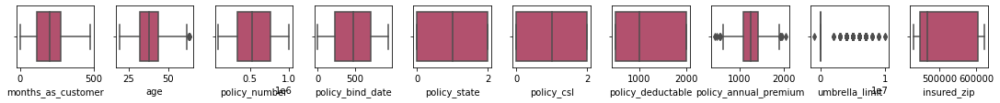

In [17]:
Columns = df1.columns.values
ncolumns = 20
nrows = 10
plt.figure(figsize=[30,15])
for i in range(0, len(Columns)):
    plt.subplot(nrows,ncolumns,i+1)
    sn.boxplot(df1[Columns[i]], color='green', orient='H', palette='flare_r')
    plt.tight_layout()

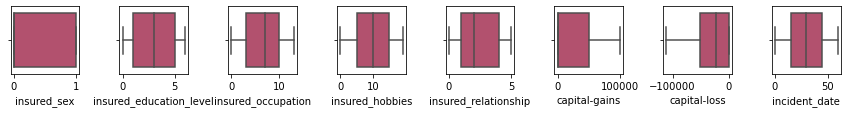

In [18]:
Columns = df2.columns.values
ncolumns = 20
nrows = 10
plt.figure(figsize=[30,15])
for i in range(0, len(Columns)):
    plt.subplot(nrows,ncolumns,i+1)
    sn.boxplot(df2[Columns[i]], color='green', orient='H', palette='flare_r')
    plt.tight_layout()

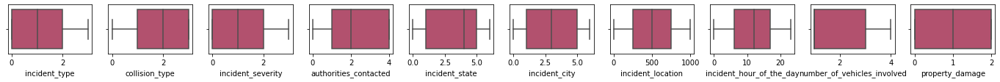

In [19]:
Columns = df3.columns.values
ncolumns = 20
nrows = 10
plt.figure(figsize=[38,15])
for i in range(0, len(Columns)):
    plt.subplot(nrows,ncolumns,i+1)
    sn.boxplot(df3[Columns[i]], color='green', orient='H', palette='flare_r')
    plt.tight_layout()

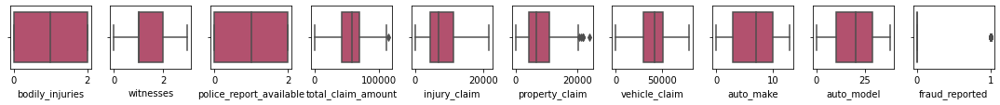

In [20]:
Columns = df4.columns.values
ncolumns = 20
nrows = 10
plt.figure(figsize=[30,15])
for i in range(0, len(Columns)):
    plt.subplot(nrows,ncolumns,i+1)
    sn.boxplot(df4[Columns[i]], color='green', orient='H', palette='flare_r')
    plt.tight_layout()

In [21]:
from scipy.stats import zscore
import numpy as np
Z = np.abs(zscore(df))
Z.shape

(1000, 38)

In [22]:
threshold = 3
print(np.where(Z>3))
new_df = df[(Z<3).all(axis=1)]

(array([ 31,  48,  88, 115, 119, 229, 248, 262, 314, 430, 458, 500, 503,
       657, 700, 763, 807, 875, 922, 975], dtype=int64), array([ 8,  8,  8,  8,  8,  7,  7,  8,  8,  8,  8, 33,  8,  8,  8,  7, 16,
        8,  8,  8], dtype=int64))


In [23]:
new_df.shape

(980, 38)

# DataLoss %

In [24]:
Loss = (1000/980)/1000*100

In [25]:
Loss

0.10204081632653061

* Here we observe a Datasloss of 0.10% after the Outlier check and removal

# EDA

# Univariate Analysis

<AxesSubplot:xlabel='months_as_customer', ylabel='Density'>

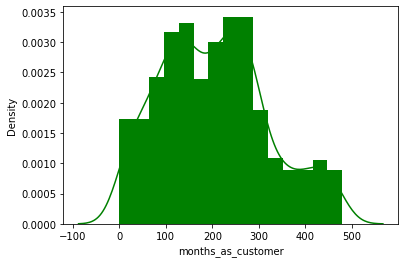

In [26]:
sn.distplot(new_df["months_as_customer"], hist_kws={'alpha':1}, color='g')

* Here we observe a good distribution of data

<AxesSubplot:xlabel='age', ylabel='Density'>

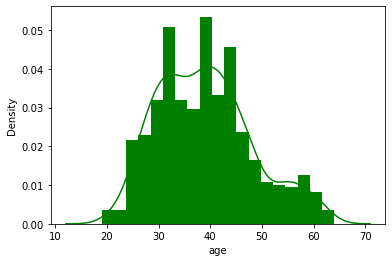

In [27]:
sn.distplot(new_df["age"], hist_kws={'alpha':1}, color='g')

* Here we observe a good distribution of data

<AxesSubplot:xlabel='policy_number', ylabel='Density'>

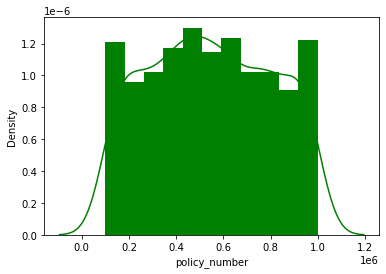

In [28]:
sn.distplot(new_df["policy_number"], hist_kws={'alpha':1}, color='g')

* Here we observe a good distribution of data

<AxesSubplot:xlabel='policy_bind_date', ylabel='Density'>

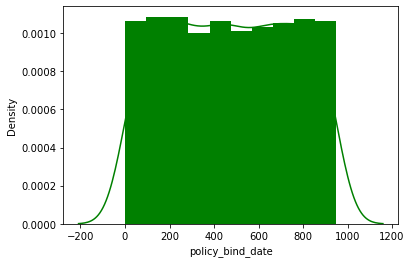

In [29]:
sn.distplot(new_df["policy_bind_date"], hist_kws={'alpha':1}, color='g')

* Here we observe a good distribution of data

<AxesSubplot:xlabel='policy_state', ylabel='Density'>

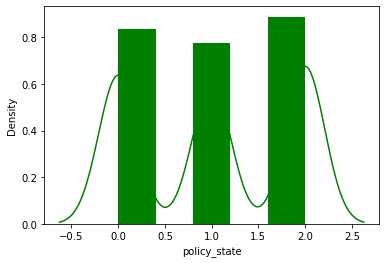

In [30]:
sn.distplot(new_df["policy_state"], hist_kws={'alpha':1}, color='g')

* Here we observe a good negative distribution of data

<AxesSubplot:xlabel='policy_csl', ylabel='Density'>

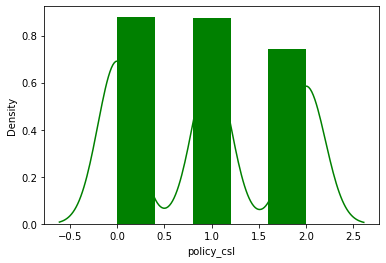

In [31]:
sn.distplot(new_df["policy_csl"], hist_kws={'alpha':1}, color='g')

* Here we observe a good distribution of data

<AxesSubplot:xlabel='policy_deductable', ylabel='Density'>

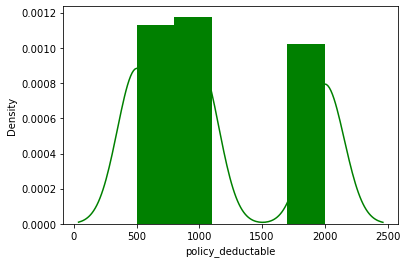

In [32]:
sn.distplot(new_df["policy_deductable"], hist_kws={'alpha':1}, color='g')

* Here we observe a good distribution of data

<AxesSubplot:xlabel='policy_annual_premium', ylabel='Density'>

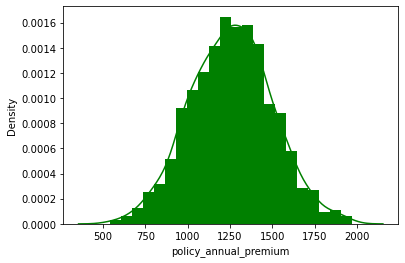

In [33]:
sn.distplot(new_df["policy_annual_premium"], hist_kws={'alpha':1}, color='g')

* Here we observe a good distribution of data

<AxesSubplot:xlabel='umbrella_limit', ylabel='Density'>

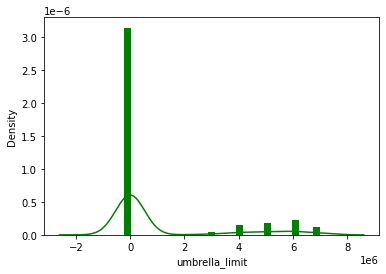

In [34]:
sn.distplot(new_df["umbrella_limit"], hist_kws={'alpha':1}, color='g')

* Here we observe high Positive skewness in data

<AxesSubplot:xlabel='insured_sex', ylabel='Density'>

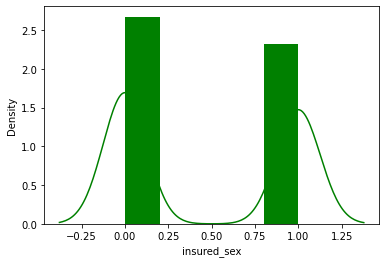

In [35]:
sn.distplot(new_df["insured_sex"], hist_kws={'alpha':1}, color='g')

* Here we observe a good distribution of data

<AxesSubplot:xlabel='insured_education_level', ylabel='Density'>

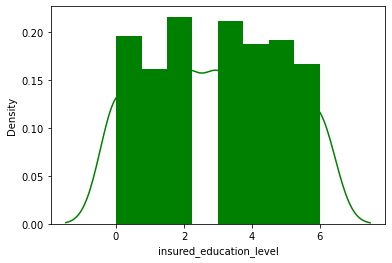

In [36]:
sn.distplot(new_df["insured_education_level"], hist_kws={'alpha':1}, color='g')

* Here we observe a good distribution of data

<AxesSubplot:xlabel='insured_occupation', ylabel='Density'>

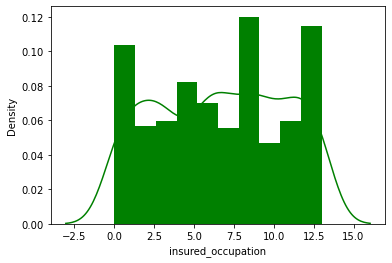

In [37]:
sn.distplot(new_df["insured_occupation"], hist_kws={'alpha':1}, color='g')

* Here we observe a good negative distribution of data

<AxesSubplot:xlabel='insured_hobbies', ylabel='Density'>

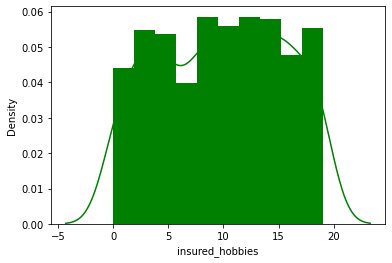

In [38]:
sn.distplot(new_df["insured_hobbies"], hist_kws={'alpha':1}, color='g')

* Here we observe a good negative distribution of data

<AxesSubplot:xlabel='insured_relationship', ylabel='Density'>

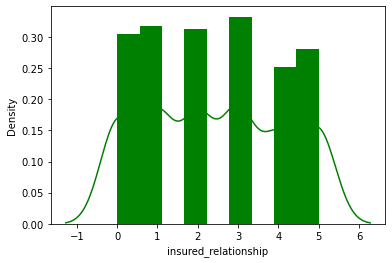

In [39]:
sn.distplot(new_df["insured_relationship"], hist_kws={'alpha':1}, color='g')

* Here we observe a good distribution of data

<AxesSubplot:xlabel='capital-gains', ylabel='Density'>

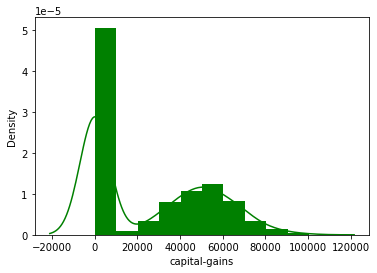

In [40]:
sn.distplot(new_df["capital-gains"], hist_kws={'alpha':1}, color='g')

* Here we observe a good distribution of data

<AxesSubplot:xlabel='capital-loss', ylabel='Density'>

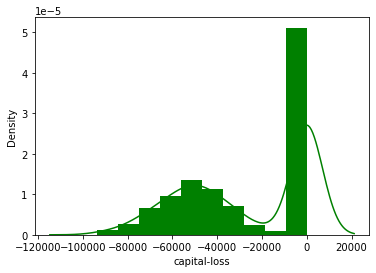

In [41]:
sn.distplot(new_df["capital-loss"], hist_kws={'alpha':1}, color='g')

* Here we observe a good negative distribution of data

<AxesSubplot:xlabel='incident_date', ylabel='Density'>

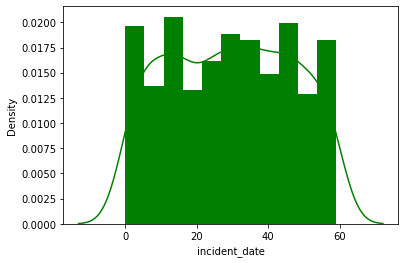

In [42]:
sn.distplot(new_df["incident_date"], hist_kws={'alpha':1}, color='g')

* Here we observe a good distribution of data

<AxesSubplot:xlabel='incident_type', ylabel='Density'>

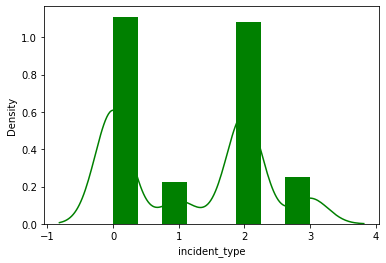

In [43]:
sn.distplot(new_df["incident_type"], hist_kws={'alpha':1}, color='g')

* Here we observe a good distribution of data

<AxesSubplot:xlabel='collision_type', ylabel='Density'>

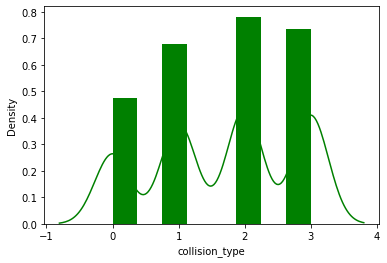

In [44]:
sn.distplot(new_df["collision_type"], hist_kws={'alpha':1}, color='g')

* Here we observe a good negative distribution of data

<AxesSubplot:xlabel='incident_severity', ylabel='Density'>

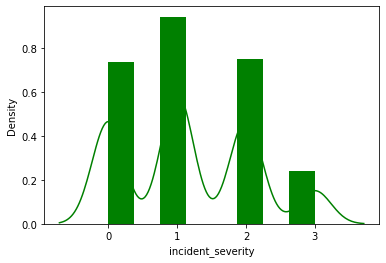

In [45]:
sn.distplot(new_df["incident_severity"], hist_kws={'alpha':1}, color='g')

* Here we observe a good distribution of data

<AxesSubplot:xlabel='authorities_contacted', ylabel='Density'>

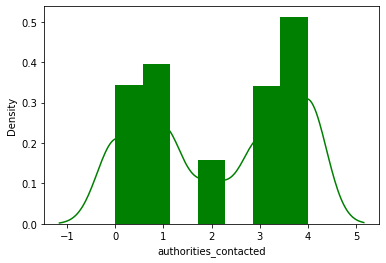

In [46]:
sn.distplot(new_df["authorities_contacted"], hist_kws={'alpha':1}, color='g')

* Here we observe a good negative distribution of data

<AxesSubplot:xlabel='incident_state', ylabel='Density'>

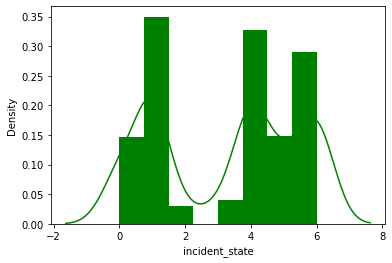

In [47]:
sn.distplot(new_df["incident_state"], hist_kws={'alpha':1}, color='g')

* Here we observe a good negative distribution of data

<AxesSubplot:xlabel='incident_city', ylabel='Density'>

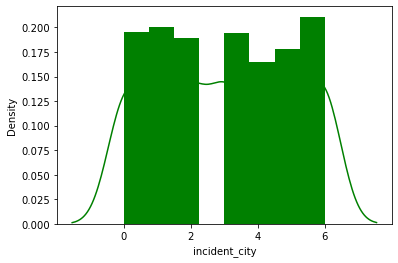

In [48]:
sn.distplot(new_df["incident_city"], hist_kws={'alpha':1}, color='g')

* Here we observe a good distribution of data

<AxesSubplot:xlabel='incident_location', ylabel='Density'>

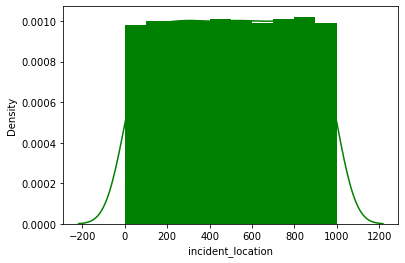

In [49]:
sn.distplot(new_df["incident_location"], hist_kws={'alpha':1}, color='g')

* Here we observe a good negative distribution of data

<AxesSubplot:xlabel='incident_hour_of_the_day', ylabel='Density'>

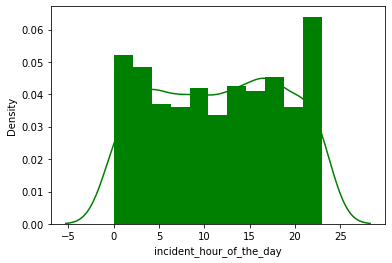

In [50]:
sn.distplot(new_df["incident_hour_of_the_day"], hist_kws={'alpha':1}, color='g')

* Here we observe a good negative distribution of data

<AxesSubplot:xlabel='number_of_vehicles_involved', ylabel='Density'>

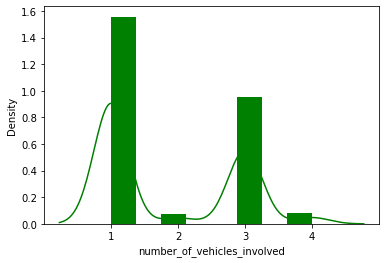

In [51]:
sn.distplot(new_df["number_of_vehicles_involved"], hist_kws={'alpha':1}, color='g')

* Here we observe a good distribution of data

<AxesSubplot:xlabel='property_damage', ylabel='Density'>

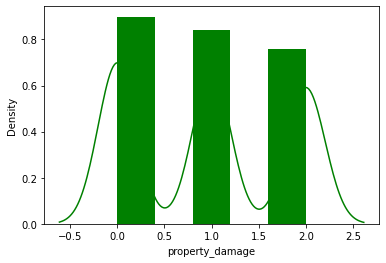

In [52]:
sn.distplot(new_df["property_damage"], hist_kws={'alpha':1}, color='g')

* Here we observe a good distribution of data

<AxesSubplot:xlabel='bodily_injuries', ylabel='Density'>

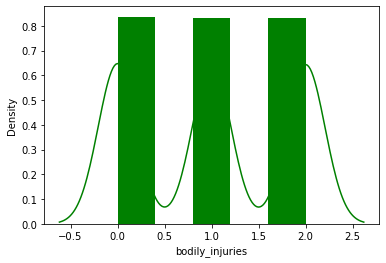

In [53]:
sn.distplot(new_df["bodily_injuries"], hist_kws={'alpha':1}, color='g')

* Here we observe a good distribution of data

<AxesSubplot:xlabel='witnesses', ylabel='Density'>

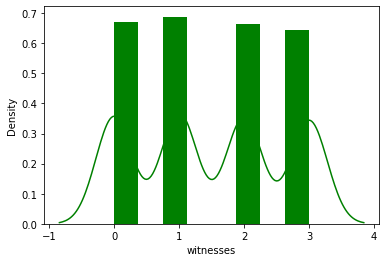

In [54]:
sn.distplot(new_df["witnesses"], hist_kws={'alpha':1}, color='g')

* Here we observe a good distribution of data

<AxesSubplot:xlabel='police_report_available', ylabel='Density'>

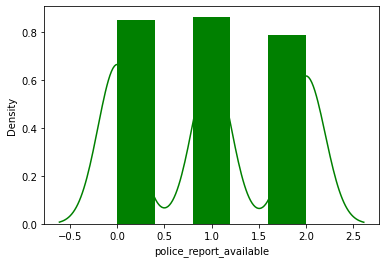

In [55]:
sn.distplot(new_df["police_report_available"], hist_kws={'alpha':1}, color='g')

* Here we observe a good distribution of data

<AxesSubplot:xlabel='total_claim_amount', ylabel='Density'>

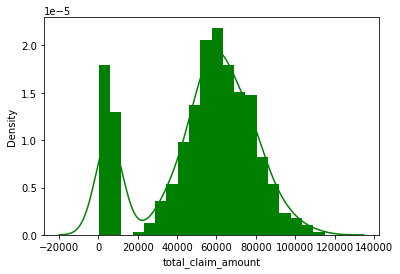

In [56]:
sn.distplot(new_df["total_claim_amount"], hist_kws={'alpha':1}, color='g')

* Here we observe a good negative distribution of data

<AxesSubplot:xlabel='injury_claim', ylabel='Density'>

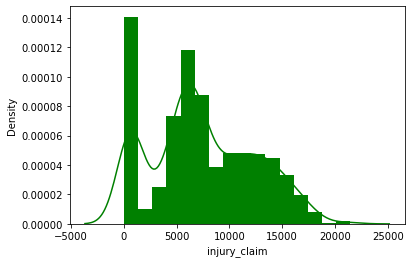

In [57]:
sn.distplot(new_df["injury_claim"], hist_kws={'alpha':1}, color='g')

* Here we observe a good distribution of data

<AxesSubplot:xlabel='property_claim', ylabel='Density'>

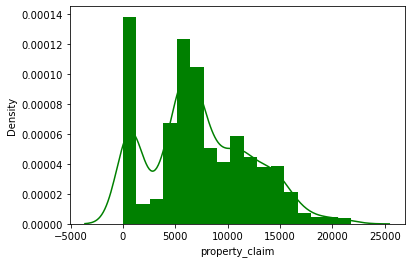

In [58]:
sn.distplot(new_df["property_claim"], hist_kws={'alpha':1}, color='g')

* Here we observe a good distribution of data

<AxesSubplot:xlabel='vehicle_claim', ylabel='Density'>

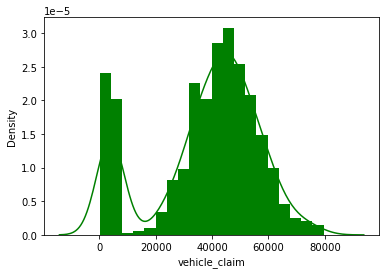

In [59]:
sn.distplot(new_df["vehicle_claim"], hist_kws={'alpha':1}, color='g')

* Here we observe a good negative distribution of data

<AxesSubplot:xlabel='auto_make', ylabel='Density'>

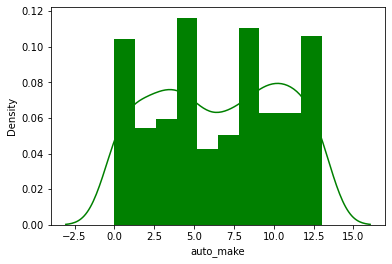

In [60]:
sn.distplot(new_df["auto_make"], hist_kws={'alpha':1}, color='g')

* Here we observe a good negative distribution of data

<AxesSubplot:xlabel='auto_model', ylabel='Density'>

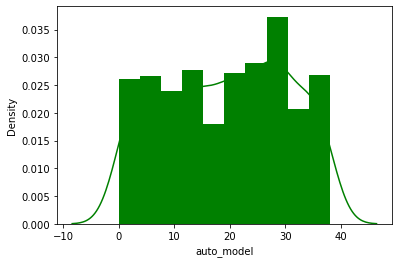

In [61]:
sn.distplot(new_df["auto_model"], hist_kws={'alpha':1}, color='g')

* Here we observe a good negative distribution of data

<AxesSubplot:xlabel='fraud_reported', ylabel='Density'>

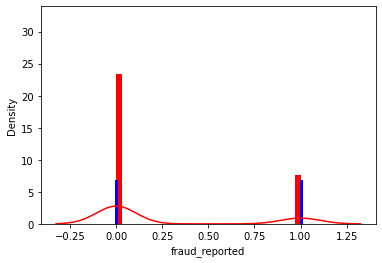

In [62]:
sn.distplot(new_df["fraud_reported"], hist_kws={'alpha':1}, color='r', rug=True, rug_kws={"color": "b", "alpha": 0.5, "linewidth": 3, "height":0.2})

* Here we observe high Positive skewness in data

# Scatterplot

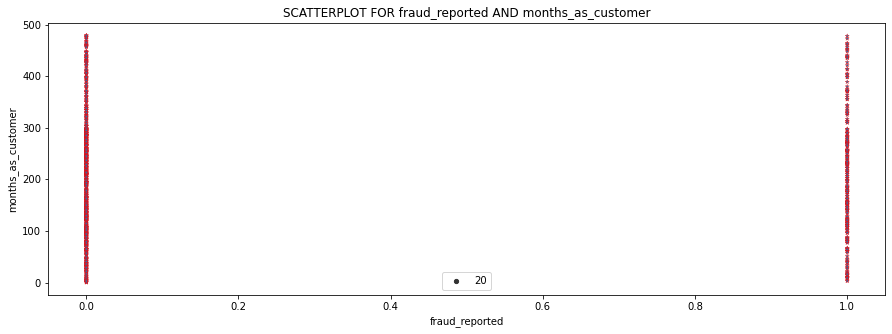

In [63]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND months_as_customer')

sn.scatterplot(new_df['fraud_reported'], new_df['months_as_customer'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe majority of scattered data for Yes fraud report for all months_as_customer data

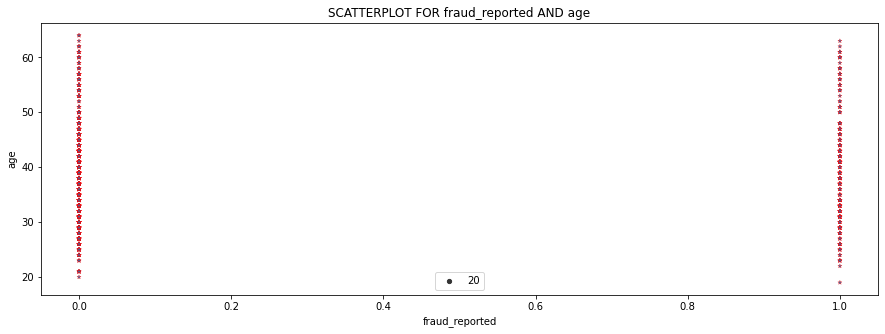

In [64]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND age')

sn.scatterplot(new_df['fraud_reported'], new_df['age'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe majority of scattered data for No fraud report for all age data

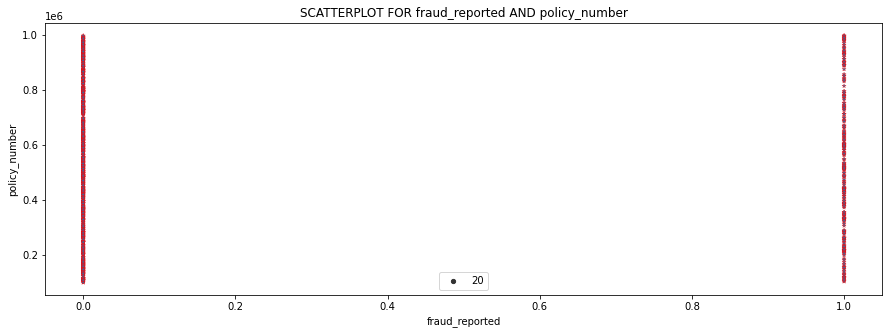

In [65]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND policy_number')

sn.scatterplot(new_df['fraud_reported'], new_df['policy_number'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe majority of scattered data for No fraud report for all policy_number data

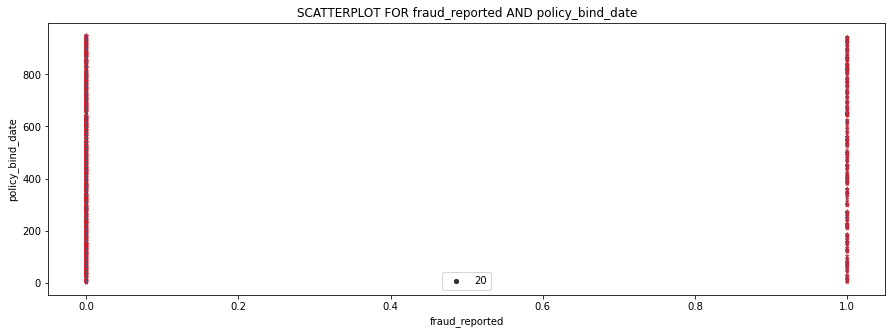

In [66]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND policy_bind_date')

sn.scatterplot(new_df['fraud_reported'], new_df['policy_bind_date'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe majority of scattered data for No fraud report for all policy_bind_date data

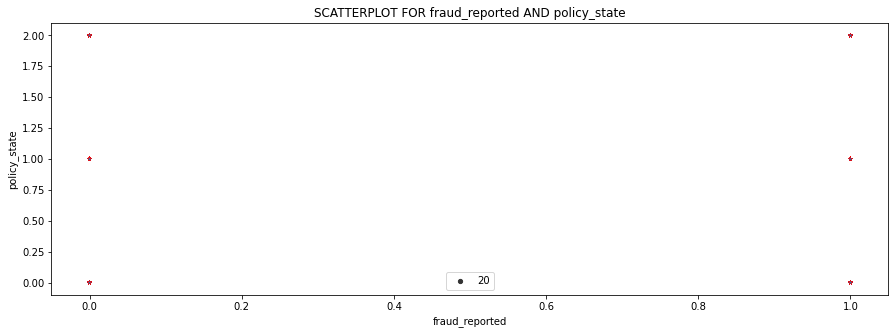

In [67]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND policy_state')

sn.scatterplot(new_df['fraud_reported'], new_df['policy_state'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe equal amount of scattered data for all fraud report for all types of policy_state data

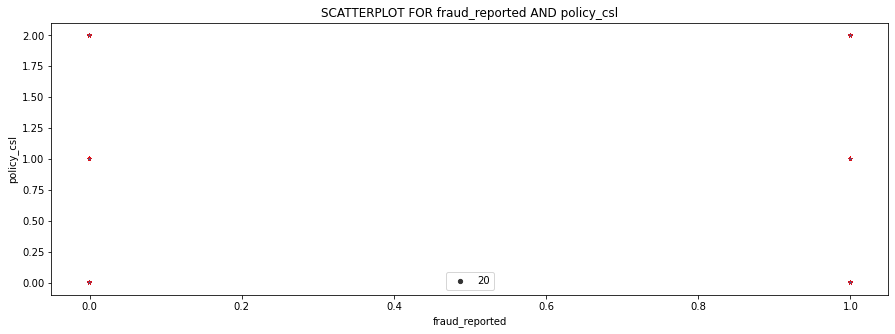

In [68]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND policy_csl')

sn.scatterplot(new_df['fraud_reported'], new_df['policy_csl'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe equal amount of scattered data for all fraud report for all types of policy_csl data

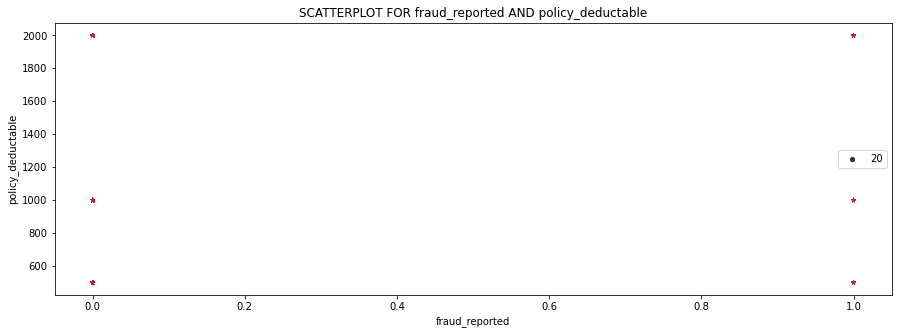

In [69]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND policy_deductable')

sn.scatterplot(new_df['fraud_reported'], new_df['policy_deductable'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe equal amount of scattered data for all fraud report for all types of policy_deductable data

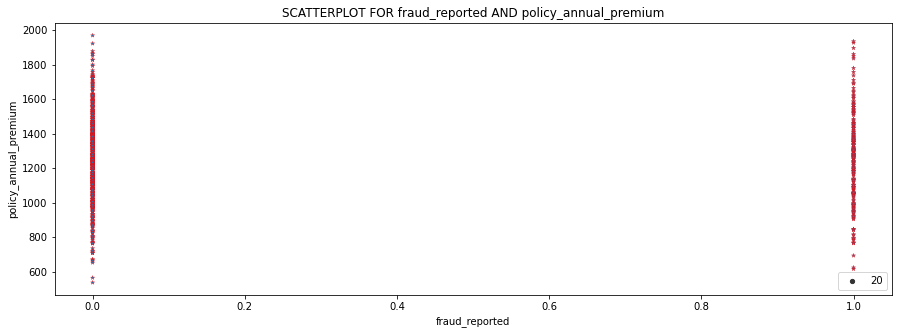

In [70]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND policy_annual_premium')

sn.scatterplot(new_df['fraud_reported'], new_df['policy_annual_premium'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe almost equal amount of scattered data for all fraud report for all types of policy_annual_premium

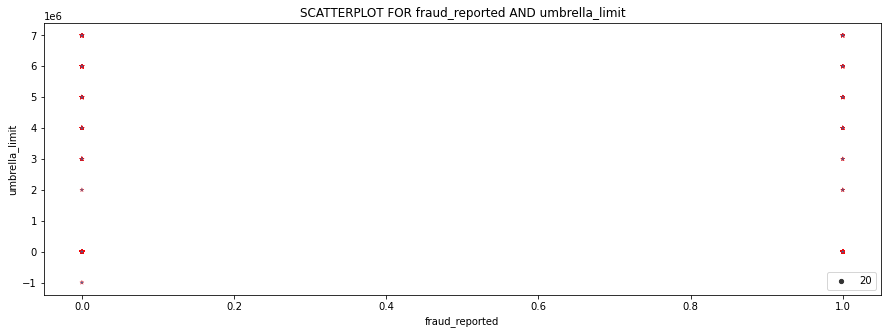

In [71]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND umbrella_limit')

sn.scatterplot(new_df['fraud_reported'], new_df['umbrella_limit'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe equal amount of scattered data for all fraud report for all types of umbrella_limit data

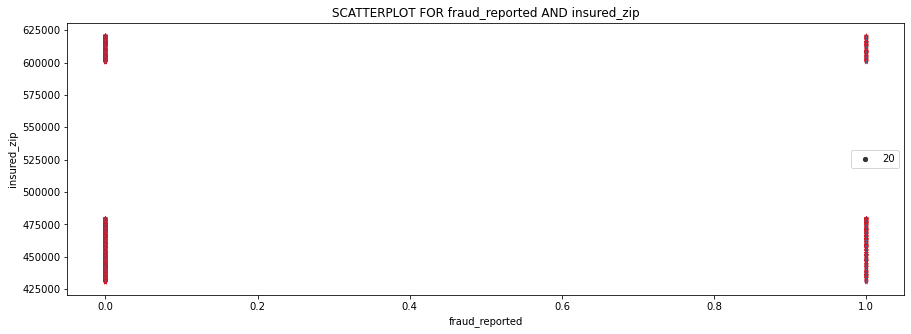

In [72]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND insured_zip')

sn.scatterplot(new_df['fraud_reported'], new_df['insured_zip'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe equal amount of scattered data for all fraud report for all types of insured_zip data

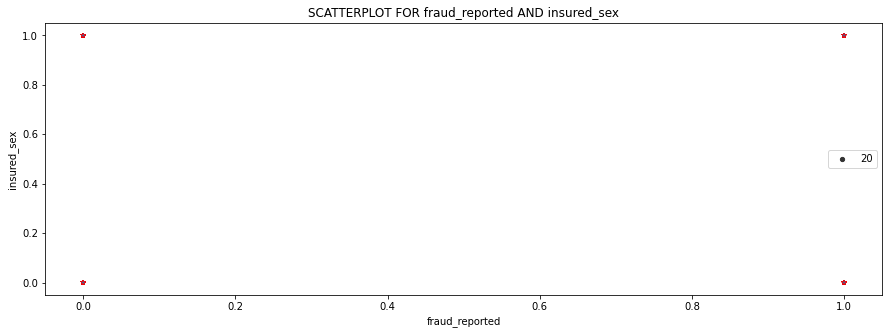

In [73]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND insured_sex')

sn.scatterplot(new_df['fraud_reported'], new_df['insured_sex'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe equal amount of scattered data for all fraud report for all types of insured_sex data

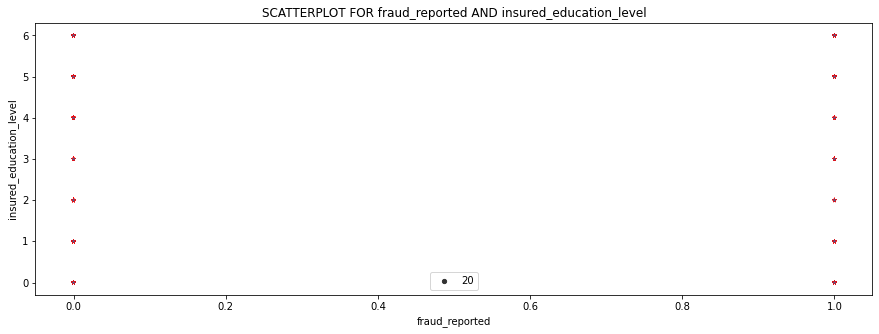

In [74]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND insured_education_level')

sn.scatterplot(new_df['fraud_reported'], new_df['insured_education_level'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe equal amount of scattered data for all fraud report for all types of insured_education_level data

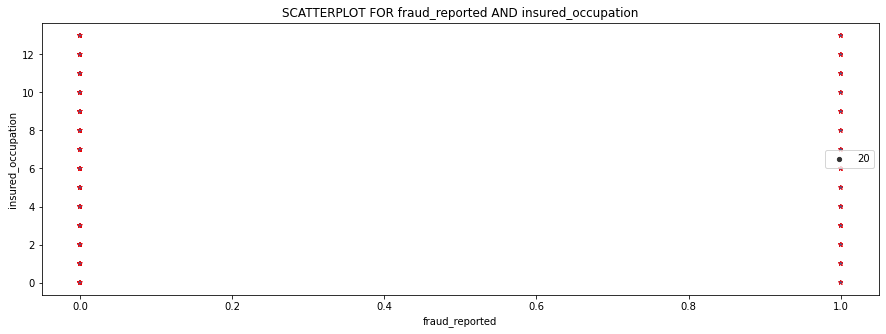

In [75]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND insured_occupation')

sn.scatterplot(new_df['fraud_reported'], new_df['insured_occupation'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe equal amount of scattered data for all fraud report for all types of insured_occupation data

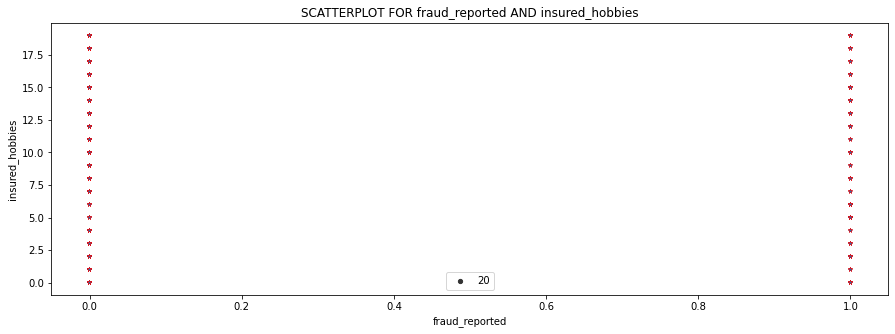

In [76]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND insured_hobbies')

sn.scatterplot(new_df['fraud_reported'], new_df['insured_hobbies'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe equal amount of scattered data for all fraud report for all types of insured_hobbies data

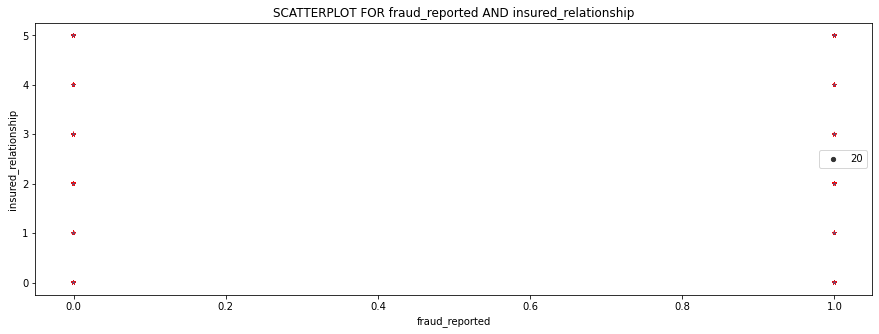

In [77]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND insured_relationship')

sn.scatterplot(new_df['fraud_reported'], new_df['insured_relationship'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe equal amount of scattered data for all fraud report for all types of insured_relationship data

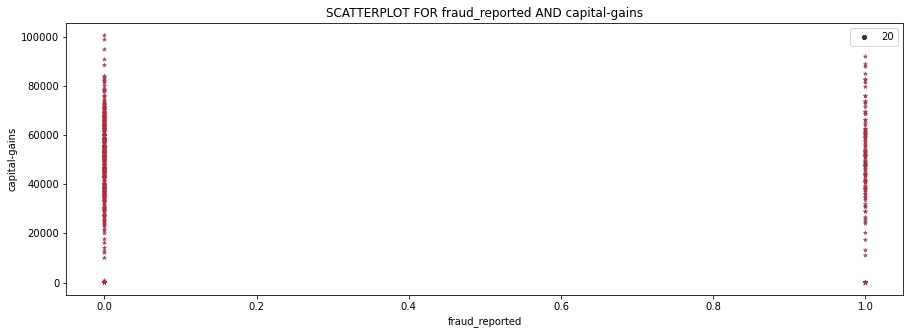

In [78]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND capital-gains')

sn.scatterplot(new_df['fraud_reported'], new_df['capital-gains'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe majority of scattered data for No fraud report for all capital-gains data

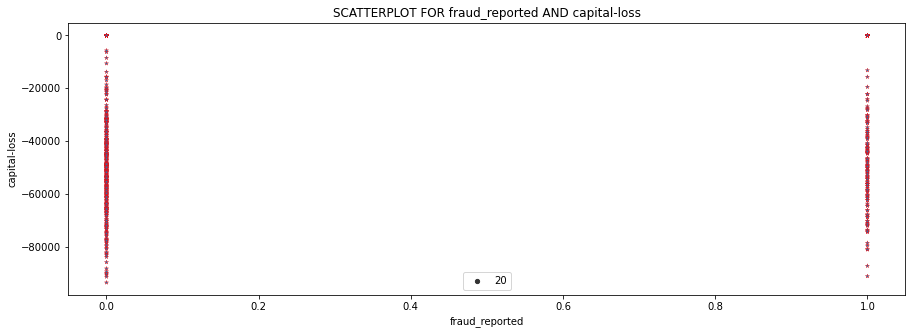

In [79]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND capital-loss')

sn.scatterplot(new_df['fraud_reported'], new_df['capital-loss'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe majority of scattered data for No fraud report for all capital-loss data

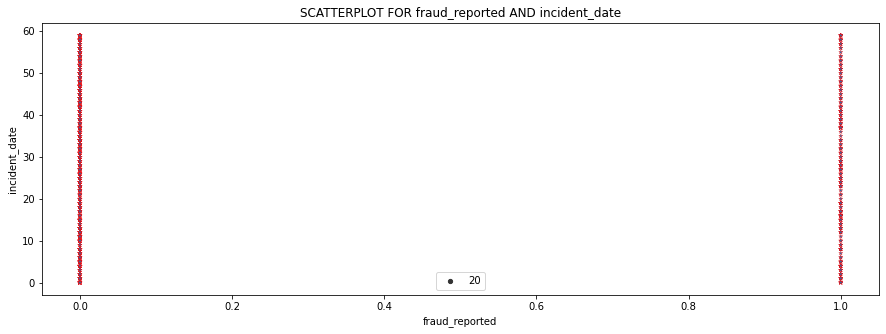

In [80]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND incident_date')

sn.scatterplot(new_df['fraud_reported'], new_df['incident_date'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe majority of scattered data for No fraud report for all incident_date data

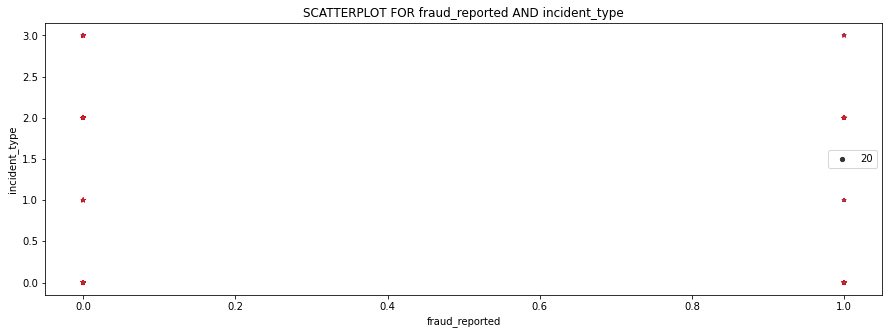

In [81]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND incident_type')

sn.scatterplot(new_df['fraud_reported'], new_df['incident_type'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe equal amount of scattered data for all fraud report for all types of incident_type data 

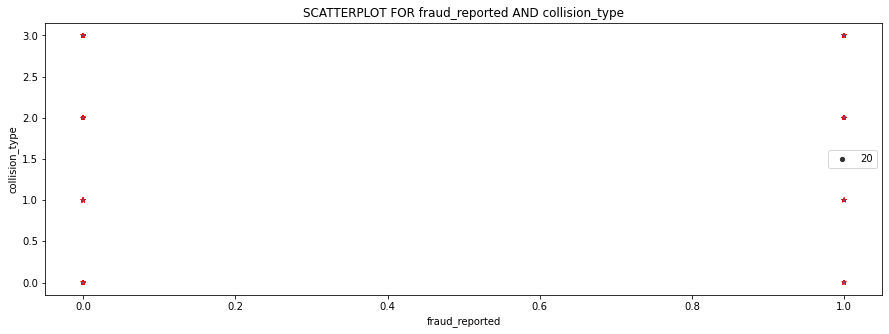

In [82]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND collision_type')

sn.scatterplot(new_df['fraud_reported'], new_df['collision_type'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe equal amount of scattered data for all fraud report for all types of collision_type data 

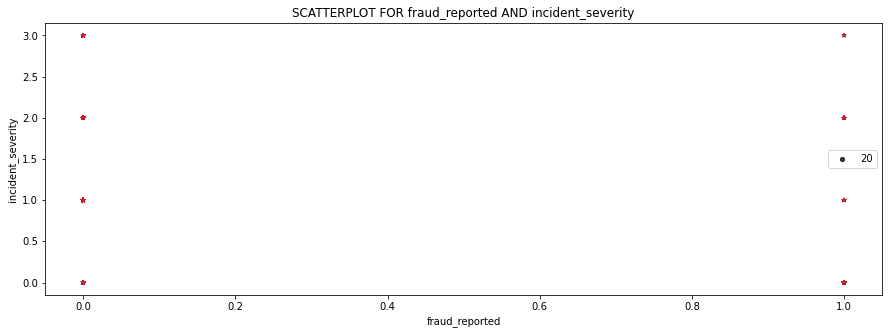

In [83]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND incident_severity')

sn.scatterplot(new_df['fraud_reported'], new_df['incident_severity'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe equal amount of scattered data for all fraud report for all types of collision_type data 

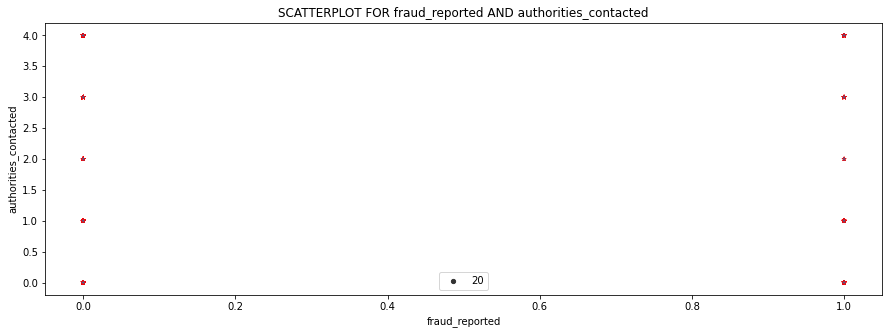

In [84]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND authorities_contacted')

sn.scatterplot(new_df['fraud_reported'], new_df['authorities_contacted'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe equal amount of scattered data for all fraud report for all types of authorities_contacted data 

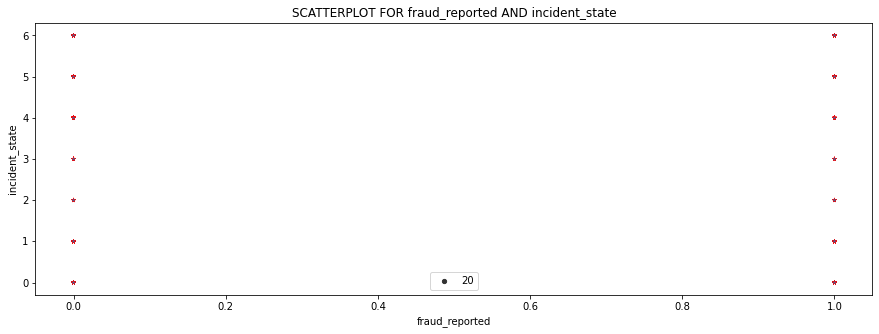

In [85]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND incident_state')

sn.scatterplot(new_df['fraud_reported'], new_df['incident_state'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe equal amount of scattered data for all fraud report for all types of incident_state data 

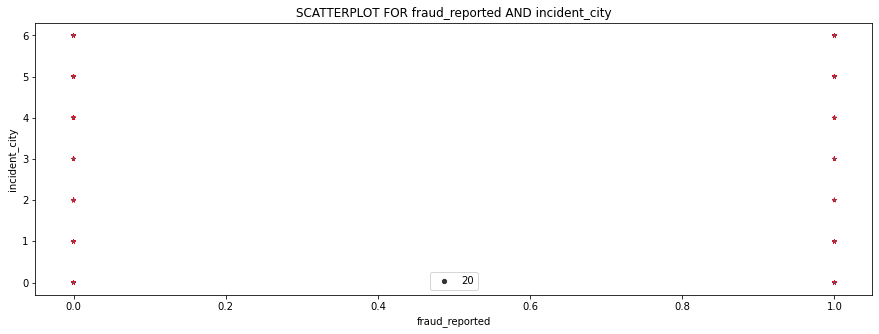

In [86]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND incident_city')

sn.scatterplot(new_df['fraud_reported'], new_df['incident_city'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe equal amount of scattered data for all fraud report for all types of incident_city data 

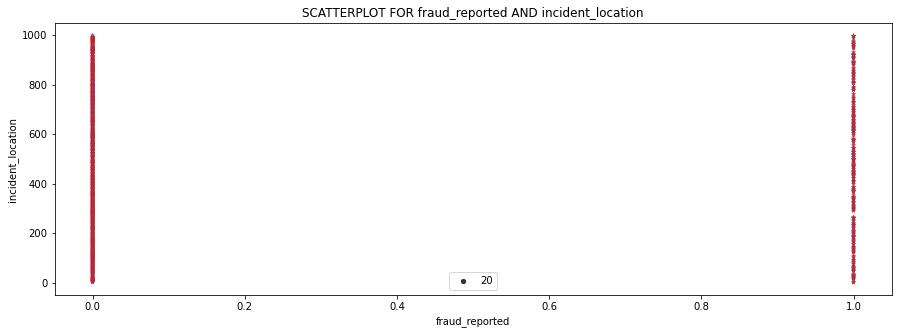

In [87]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND incident_location')

sn.scatterplot(new_df['fraud_reported'], new_df['incident_location'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe majority of scattered data for No fraud report for all incident_location data

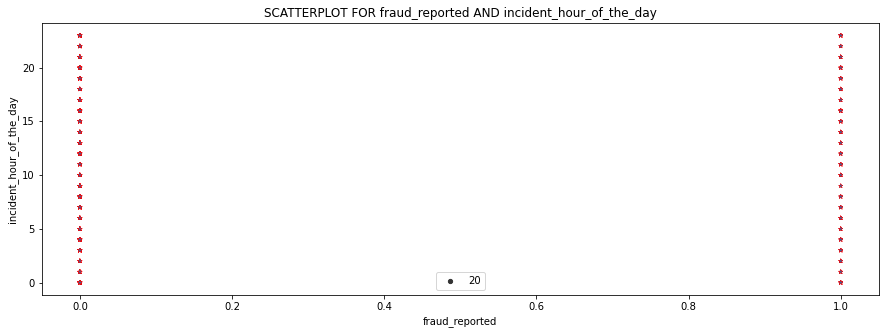

In [88]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND incident_hour_of_the_day')

sn.scatterplot(new_df['fraud_reported'], new_df['incident_hour_of_the_day'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe equal amount of scattered data for all fraud report for all types of incident_hour_of_the_day data 

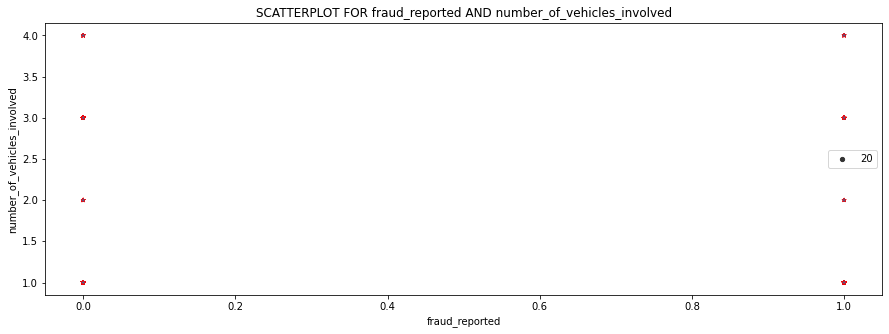

In [89]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND number_of_vehicles_involved')

sn.scatterplot(new_df['fraud_reported'], new_df['number_of_vehicles_involved'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe equal amount of scattered data for all fraud report for all types of number_of_vehicles_involved data 

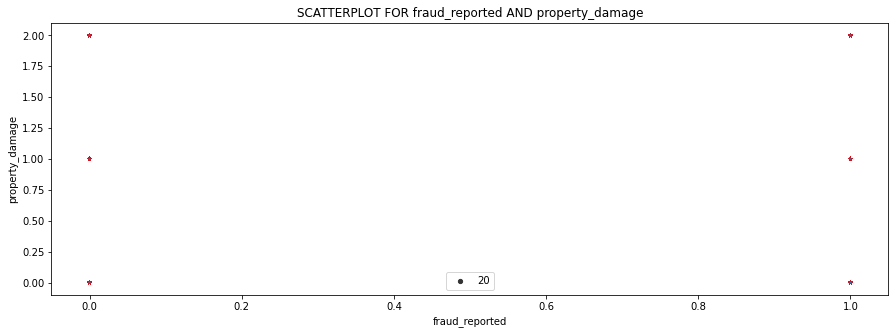

In [90]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND property_damage')

sn.scatterplot(new_df['fraud_reported'], new_df['property_damage'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe equal amount of scattered data for all fraud report for all types of property_damage data 

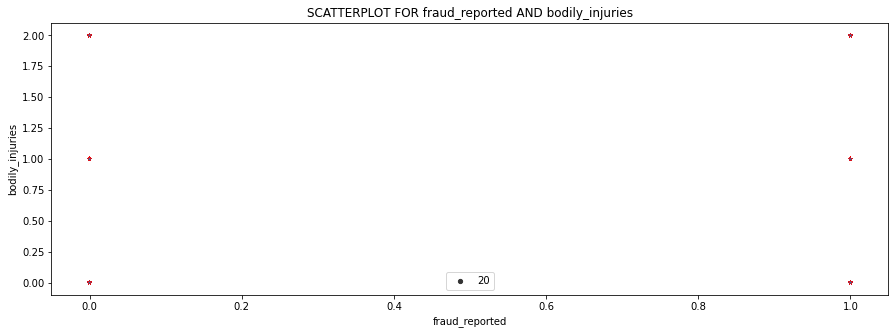

In [91]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND bodily_injuries')

sn.scatterplot(new_df['fraud_reported'], new_df['bodily_injuries'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe equal amount of scattered data for all fraud report for all types of bodily_injuries data 

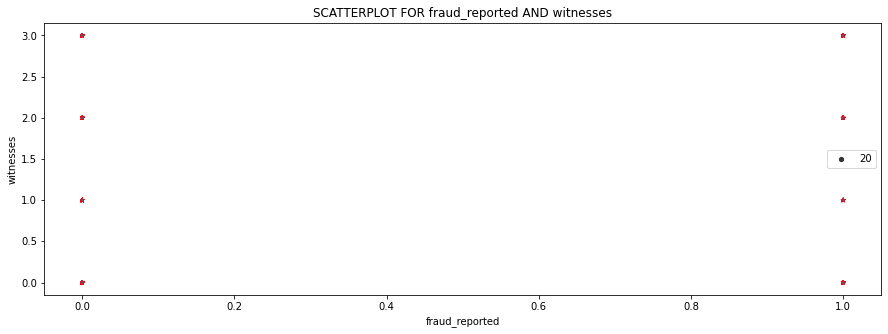

In [92]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND witnesses')

sn.scatterplot(new_df['fraud_reported'], new_df['witnesses'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe equal amount of scattered data for all fraud report for all types of witnesses data 

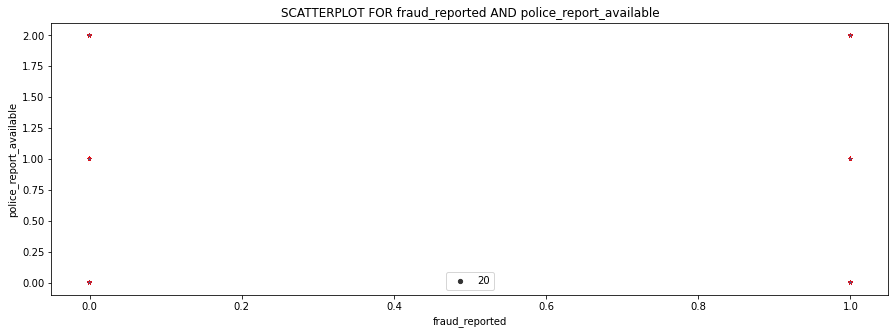

In [93]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND police_report_available')

sn.scatterplot(new_df['fraud_reported'], new_df['police_report_available'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe equal amount of scattered data for all fraud report for all types of police_report_available data 

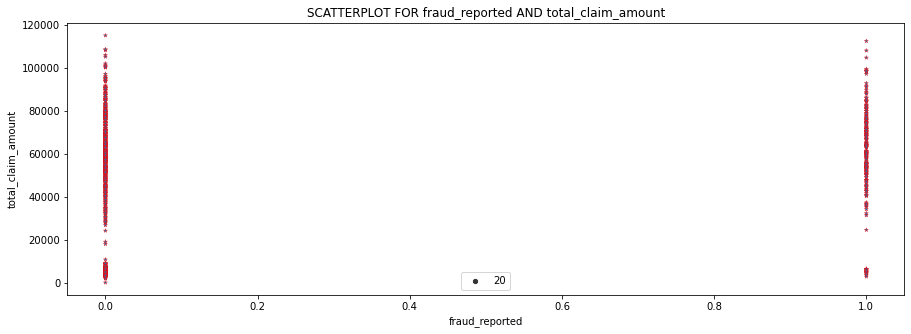

In [94]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND total_claim_amount')

sn.scatterplot(new_df['fraud_reported'], new_df['total_claim_amount'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe majority of scattered data for No fraud report for all total_claim_amount data

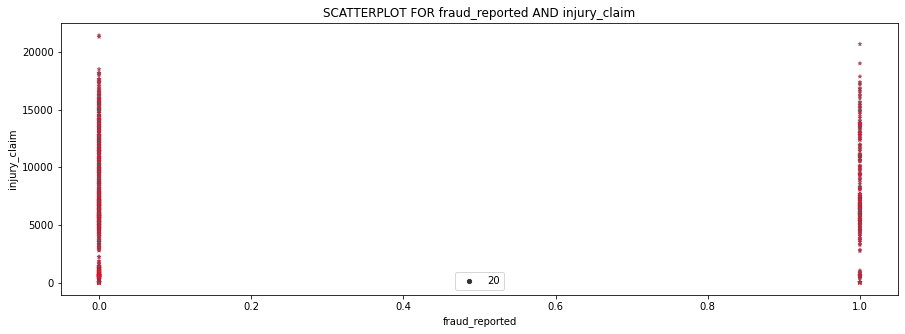

In [95]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND injury_claim')

sn.scatterplot(new_df['fraud_reported'], new_df['injury_claim'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe majority of scattered data for No fraud report for all injury_claim data

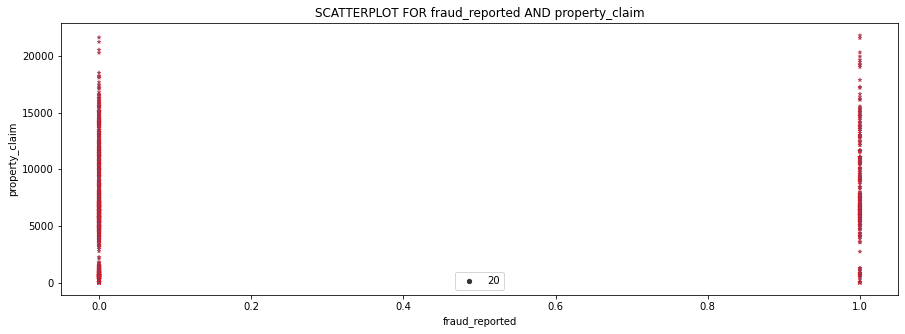

In [96]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND property_claim')

sn.scatterplot(new_df['fraud_reported'], new_df['property_claim'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe majority of scattered data for No fraud report for all property_claim data

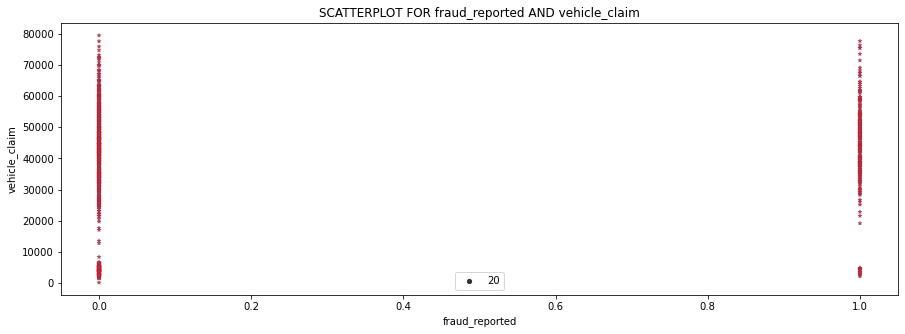

In [97]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND vehicle_claim')

sn.scatterplot(new_df['fraud_reported'], new_df['vehicle_claim'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe majority of scattered data for No fraud report for all vehicle_claim data

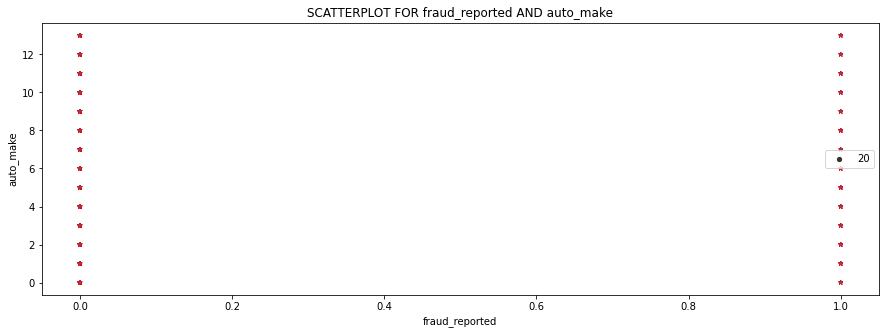

In [98]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND auto_make')

sn.scatterplot(new_df['fraud_reported'], new_df['auto_make'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe equal amount of scattered data for all fraud report for all types of auto_make data 

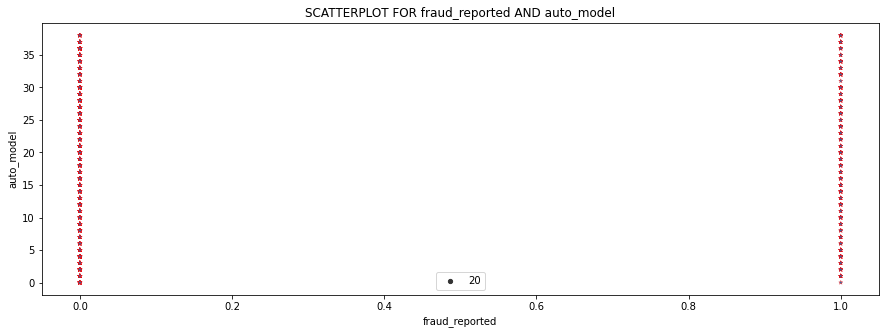

In [99]:
plt.figure(figsize=[15,5])

plt.title('SCATTERPLOT FOR fraud_reported AND auto_model')

sn.scatterplot(new_df['fraud_reported'], new_df['auto_model'], size=20, marker ="*", edgecolor ="red", alpha=1);

* Here we observe almost equal amount of scattered data for both fraud report for all auto_model data

# Catplot

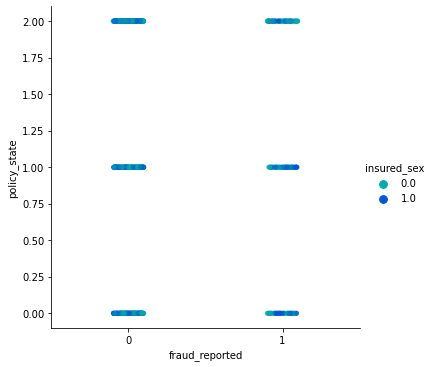

In [100]:
sn.catplot(x="fraud_reported", y="policy_state", kind='strip',data=new_df, alpha=0.5, color='k', palette="winter_r", hue="insured_sex")

* Here we observe that majority of the Fraud reported for policy_state data are both Genders have almost equal distribution

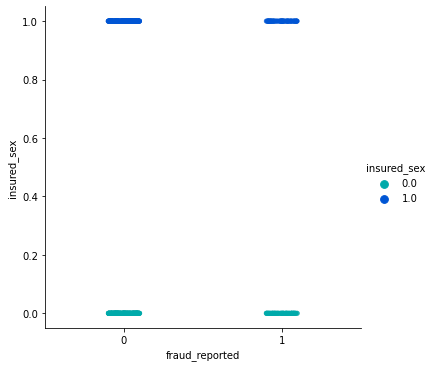

In [101]:
sn.catplot(x="fraud_reported", y="insured_sex", kind='strip',data=new_df, alpha=0.5, color='k', palette="winter_r", hue="insured_sex")

* Here we observe that majority of the Fraud reported for insured_sex data are both Genders have almost equal distribution

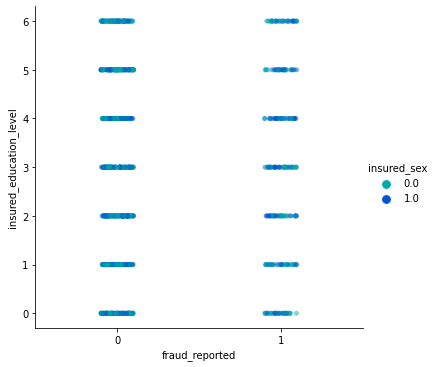

In [102]:
sn.catplot(x="fraud_reported", y="insured_education_level", kind='strip',data=new_df, alpha=0.5, color='k', palette="winter_r", hue="insured_sex")

* Here we observe that majority of the Fraud reported for insured_education_level data are both Genders have almost equal distribution 

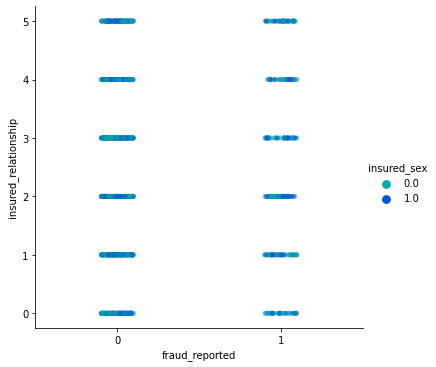

In [103]:
sn.catplot(x="fraud_reported", y="insured_relationship", kind='strip',data=new_df, alpha=0.5, color='k', palette="winter_r", hue="insured_sex")

* Here we observe that majority of the Fraud reported for insured_relationship data are both Genders have almost equal distribution except for wife  has majority data on females reporting

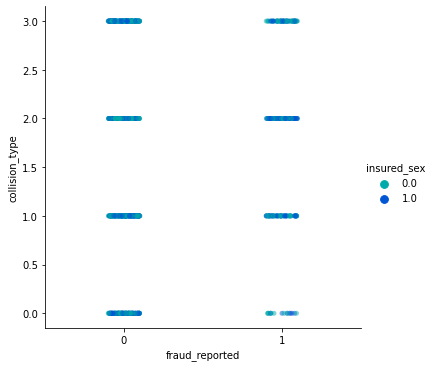

In [104]:
sn.catplot(x="fraud_reported", y="collision_type", kind='strip',data=new_df, alpha=0.5, color='k', palette="winter_r", hue="insured_sex")

* Here we observe that majority of the Fraud reported for collision_type data are both Genders have almost equal distribution except for Minor damages  has majority data on Males reporting

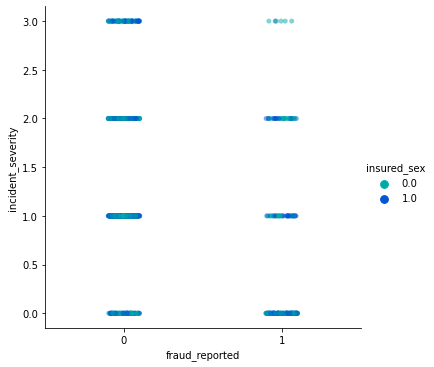

In [105]:
sn.catplot(x="fraud_reported", y="incident_severity", kind='strip',data=new_df, alpha=0.5, color='k', palette="winter_r", hue="insured_sex")

* Here we observe that majority of the Fraud reported for incident_severity data are both Genders have almost equal distribution except for Minor damages  has majority data on Males not reporting

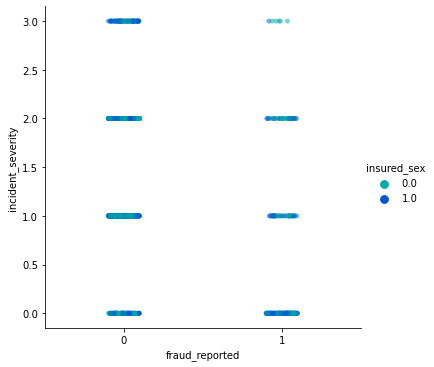

In [106]:
sn.catplot(x="fraud_reported", y="incident_severity", kind='strip',data=new_df, alpha=0.5, color='k', palette="winter_r", hue="insured_sex")

* Here we observe that majority of the Fraud reported for incident_severity data are both Genders have almost equal distribution except for Minor damages  has majority data on Males reporting

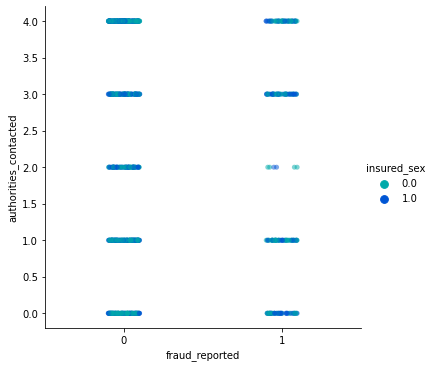

In [107]:
sn.catplot(x="fraud_reported", y="authorities_contacted", kind='strip',data=new_df, alpha=0.5, color='k', palette="winter_r", hue="insured_sex")

* Here we observe that majority of the Fraud reported for authorities_contacted data are both Genders have almost equal distribution except for None has majority data on Males

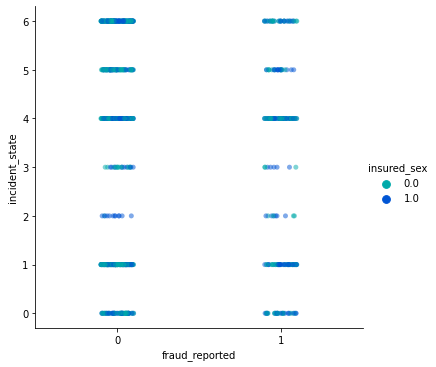

In [108]:
sn.catplot(x="fraud_reported", y="incident_state", kind='strip',data=new_df, alpha=0.5, color='k', palette="winter_r", hue="insured_sex")

* Here we observe that majority of the Fraud reported for incident_state data are both Genders have almost equal distribution

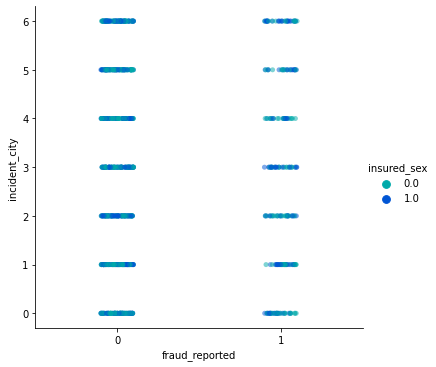

In [109]:
sn.catplot(x="fraud_reported", y="incident_city", kind='strip',data=new_df, alpha=0.5, color='k', palette="winter_r", hue="insured_sex")

* Here we observe that majority of the Fraud reported for incident_city data are both Genders have almost equal distribution

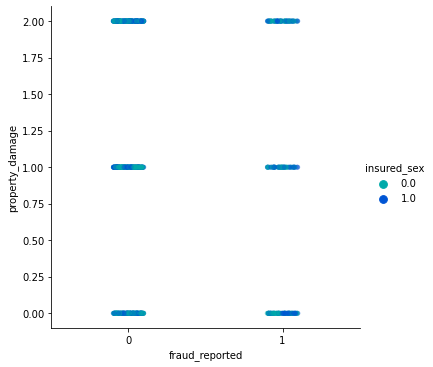

In [110]:
sn.catplot(x="fraud_reported", y="property_damage", kind='strip',data=new_df, alpha=0.5, color='k', palette="winter_r", hue="insured_sex")

* Here we observe that majority of the Fraud reported for property_damage are both Genders

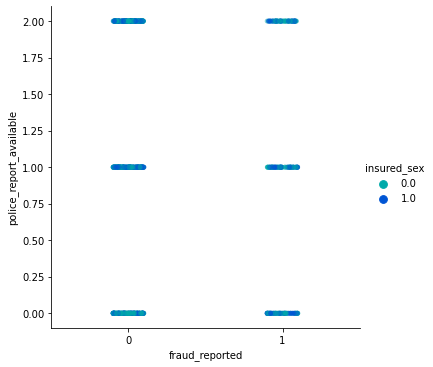

In [111]:
sn.catplot(x="fraud_reported", y="police_report_available", kind='strip',data=new_df, alpha=0.5, color='k', palette="winter_r", hue="insured_sex")

* Here we observe that majority of the Fraud reported for police_report_available are both Genders

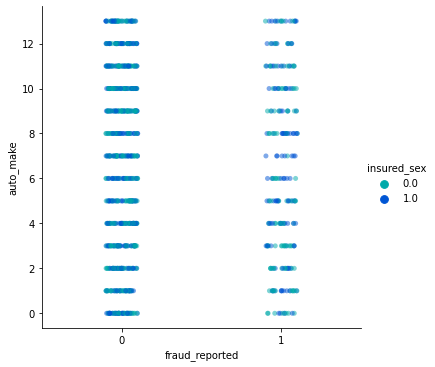

In [112]:
sn.catplot(x="fraud_reported", y="auto_make", kind='strip',data=new_df, alpha=0.5, color='k', palette="winter_r", hue="insured_sex")

* Here we observe that majority of the Fraud reported for auto_make are Female

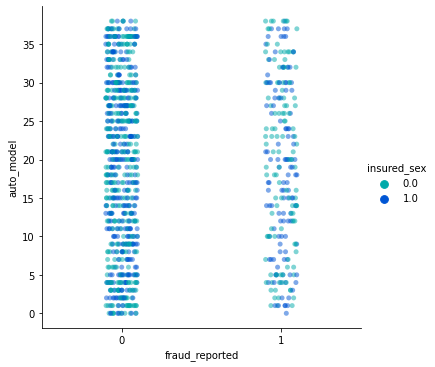

In [113]:
sn.catplot(x="fraud_reported", y="auto_model", kind='strip',data=new_df, alpha=0.5, color='k', palette="winter_r", hue="insured_sex")

* Here we observe that majority of the Fraud reported for auto_model are Female

# Countplot

<AxesSubplot:xlabel='count', ylabel='age'>

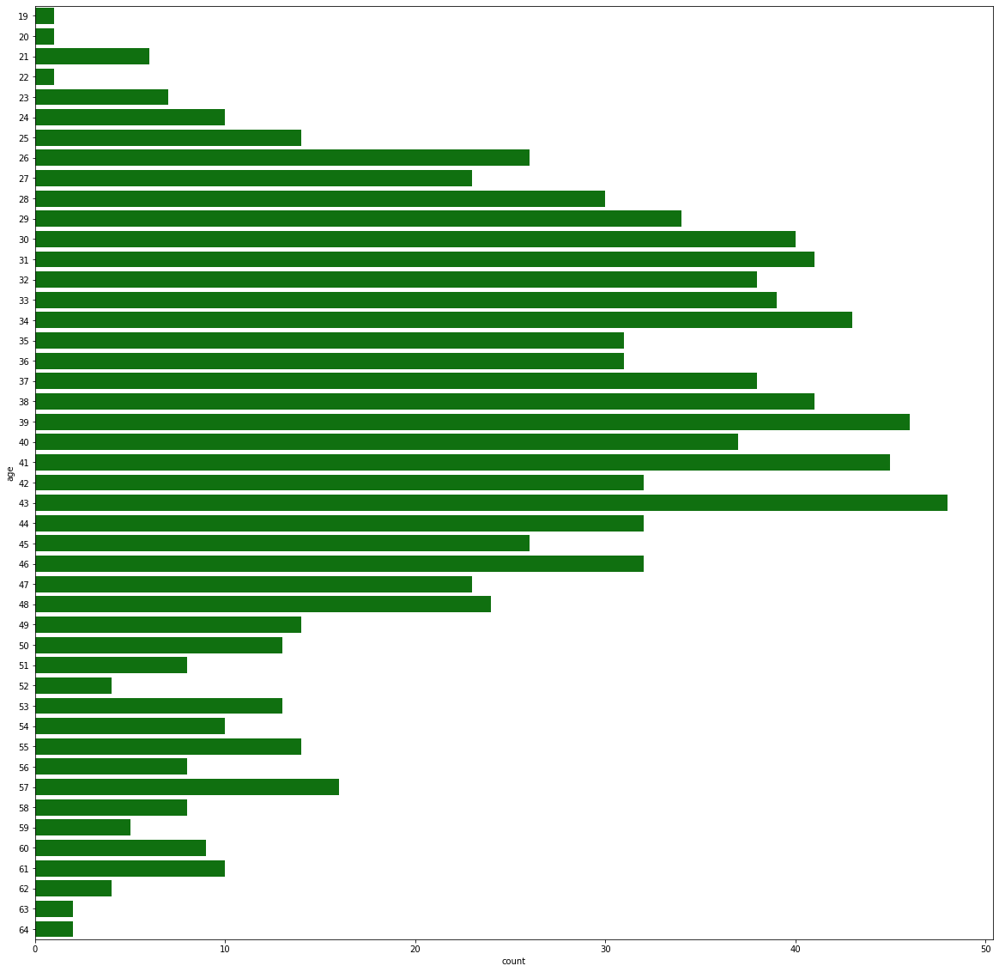

In [114]:
plt.figure(figsize=(20,20))

sn.countplot(y=new_df['age'], data=new_df, color='g')

* Here we observe that for age column the highest count is 43

<AxesSubplot:xlabel='count', ylabel='policy_state'>

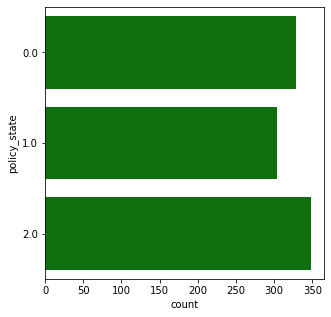

In [115]:
plt.figure(figsize=(5,5))

sn.countplot(y=new_df['policy_state'], data=new_df, color='g')

* Here we observe that for policy_state column the highest count is 2.0

<AxesSubplot:xlabel='count', ylabel='policy_csl'>

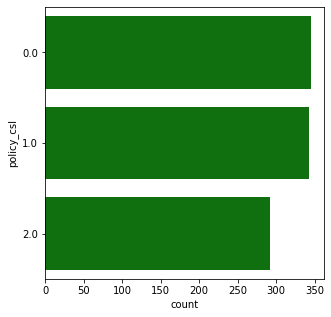

In [116]:
plt.figure(figsize=(5,5))

sn.countplot(y=new_df['policy_csl'], data=new_df, color='g')

* Here we observe that for policy_csl column the highest count is 0.0 and 1.0

<AxesSubplot:xlabel='count', ylabel='policy_deductable'>

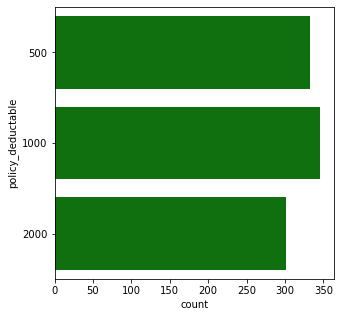

In [117]:
plt.figure(figsize=(5,5))

sn.countplot(y=new_df['policy_deductable'], data=new_df, color='g')

* Here we observe that for policy_deductable column the highest count is 1000

<AxesSubplot:xlabel='count', ylabel='umbrella_limit'>

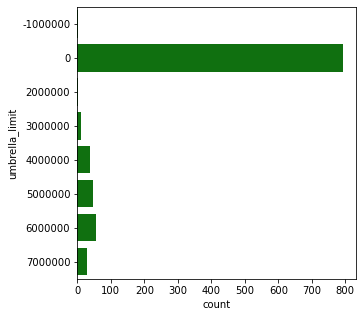

In [118]:
plt.figure(figsize=(5,5))

sn.countplot(y=new_df['umbrella_limit'], data=new_df, color='g')

* Here we observe that for umbrella_limit column the highest count is 0

<AxesSubplot:xlabel='count', ylabel='insured_education_level'>

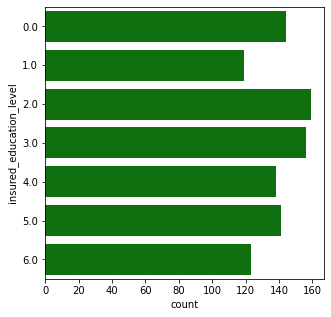

In [119]:
plt.figure(figsize=(5,5))

sn.countplot(y=new_df['insured_education_level'], data=new_df, color='g')

* Here we observe that for insured_education_level column the highest count is 2.0

<AxesSubplot:xlabel='count', ylabel='incident_type'>

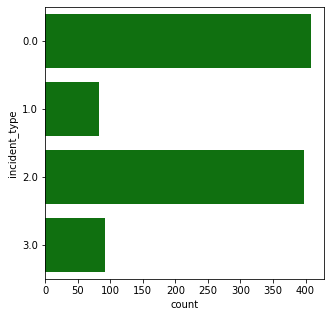

In [120]:
plt.figure(figsize=(5,5))

sn.countplot(y=new_df['incident_type'], data=new_df, color='g')

* Here we observe that for incident_type column the highest count is 0.0

<AxesSubplot:xlabel='count', ylabel='insured_relationship'>

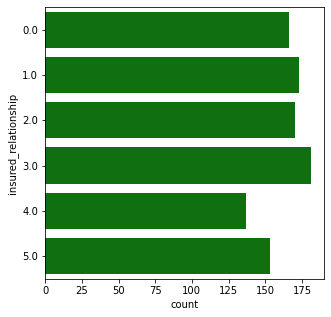

In [121]:
plt.figure(figsize=(5,5))

sn.countplot(y=new_df['insured_relationship'], data=new_df, color='g')

* Here we observe that for insured_relationship column the highest count is 3.0

<AxesSubplot:xlabel='count', ylabel='incident_date'>

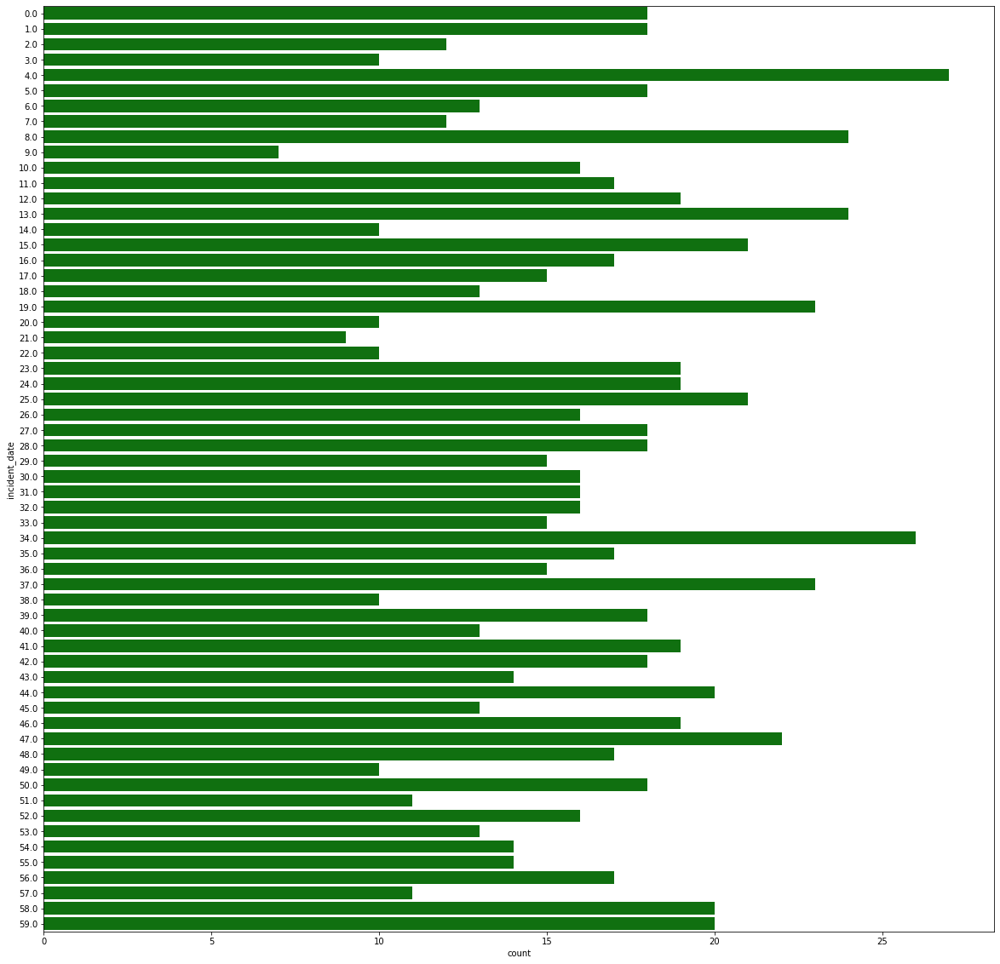

In [122]:
plt.figure(figsize=(20,20))

sn.countplot(y=new_df['incident_date'], data=new_df, color='g')

* Here we observe that for incident_date column the highest count is 4.0

<AxesSubplot:xlabel='count', ylabel='collision_type'>

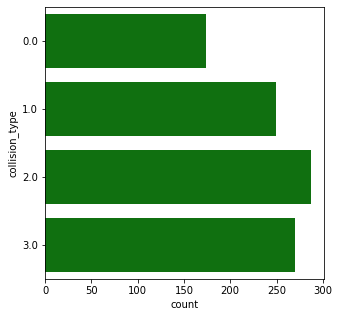

In [123]:
plt.figure(figsize=(5,5))

sn.countplot(y=new_df['collision_type'], data=new_df, color='g')

* Here we observe that for collision_type column the highest count is 2.0

<AxesSubplot:xlabel='count', ylabel='incident_hour_of_the_day'>

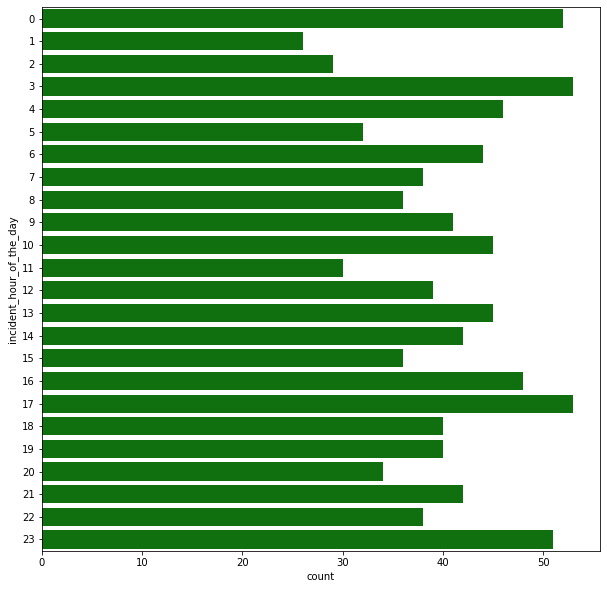

In [124]:
plt.figure(figsize=(10,10))

sn.countplot(y=new_df['incident_hour_of_the_day'], data=new_df, color='g')

* Here we observe that for incident_hour_of_the_day column the highest count is 3:00 and 17:00

<AxesSubplot:xlabel='count', ylabel='number_of_vehicles_involved'>

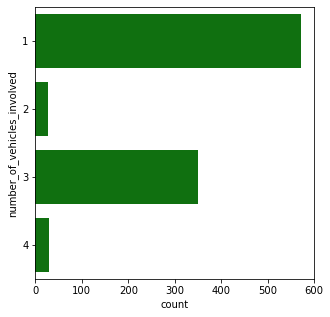

In [125]:
plt.figure(figsize=(5,5))

sn.countplot(y=new_df['number_of_vehicles_involved'], data=new_df, color='g')

* Here we observe that for number_of_vehicles_involved column the highest count is 1

<AxesSubplot:xlabel='count', ylabel='auto_make'>

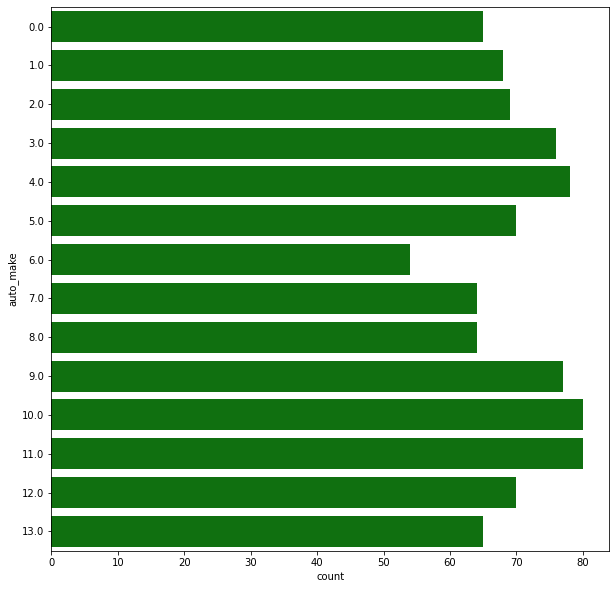

In [126]:
plt.figure(figsize=(10,10))

sn.countplot(y=new_df['auto_make'], data=new_df, color='g')

* Here we observe that for auto_make column the highest count is 10.0, 11.0

<AxesSubplot:xlabel='count', ylabel='auto_model'>

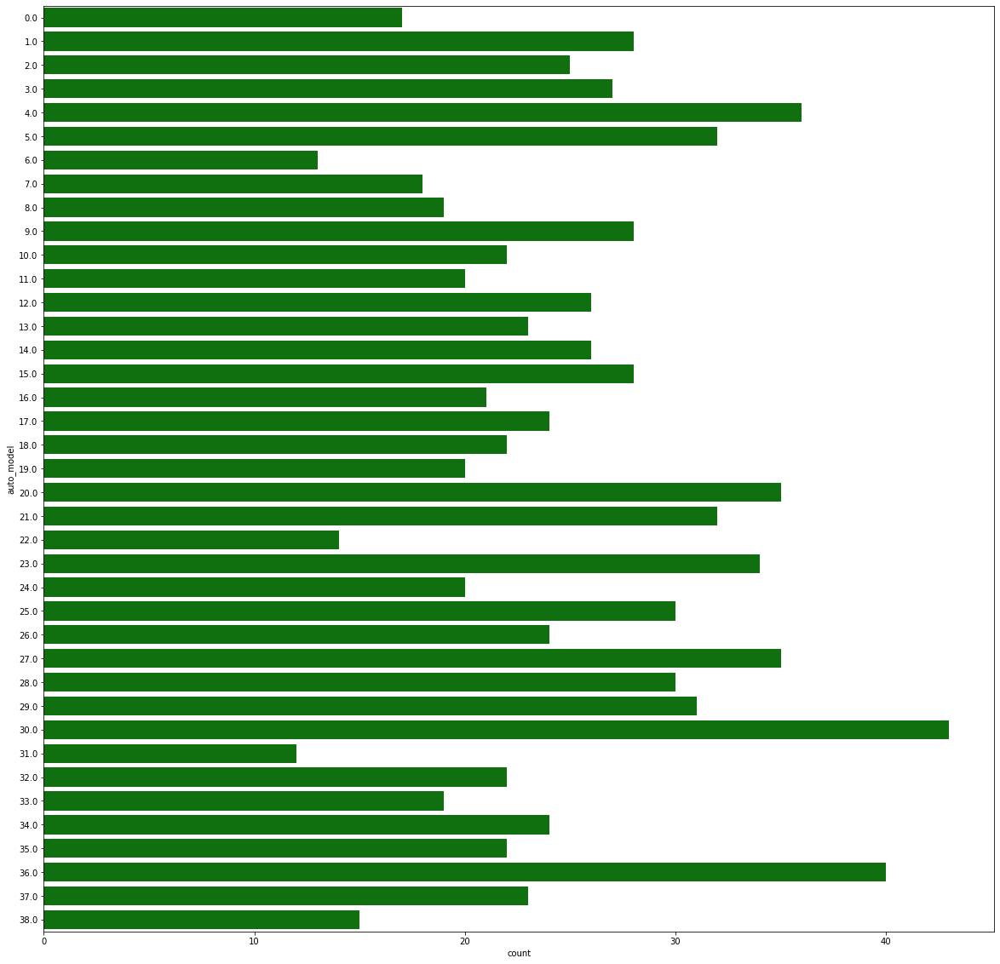

In [127]:
plt.figure(figsize=(20,20))

sn.countplot(y=new_df['auto_model'], data=new_df, color='g')

* Here we observe that for auto_model column the highest count is 30.0

# BiVariate Analysis

# Pairplot

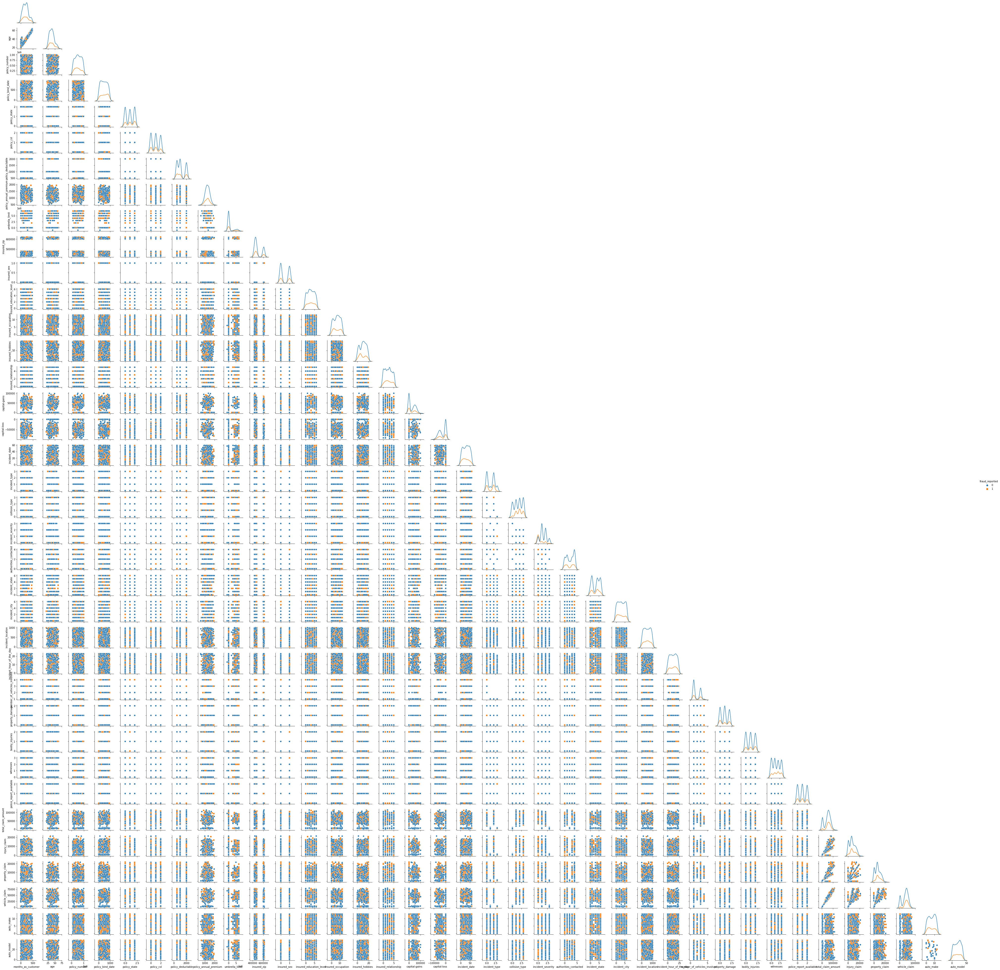

In [128]:
sn.pairplot(new_df, hue="fraud_reported", height=1.5, markers=["o", "s"], corner=True, diag_kws=dict(fill=False))

* In the above plot we observe the best paired distribution with Target column is column policy_number, insured_sex, incident_location and incident_hour_of_the_day

# Stats Heatmap

In [129]:
new_df.describe()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported
count,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,9.800000e+02,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.00000,980.000000
mean,204.613265,38.973469,546231.664286,473.508163,1.020408,0.945918,1137.244898,1257.206510,9.918367e+05,500661.760204,0.465306,2.959184,6.643878,9.743878,2.417347,25287.959184,-26692.448980,29.380612,1.177551,1.666327,1.183673,2.163265,3.242857,2.982653,500.683673,11.688776,1.834694,0.944898,0.997959,1.481633,0.975510,52693.010204,7426.244898,7386.173469,37880.591837,6.569388,19.25102,0.244898
std,115.420174,9.184040,257473.945100,275.948832,0.830713,0.804821,611.258486,241.568379,2.120943e+06,71376.814338,0.499050,1.954113,4.018943,5.692738,1.682787,27918.880339,27951.834834,17.217322,1.080568,1.062831,0.939943,1.533380,2.157771,2.037119,288.452024,6.966436,1.018331,0.812960,0.817328,1.112043,0.809426,26341.641716,4885.829062,4793.054917,18846.130656,4.028788,11.13132,0.430246
min,0.000000,19.000000,100804.000000,0.000000,0.000000,0.000000,500.000000,538.170000,-1.000000e+06,430104.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-93600.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,100.000000,0.000000,0.000000,70.000000,0.000000,0.00000,0.000000
25%,116.000000,32.000000,335980.250000,231.750000,0.000000,0.000000,500.000000,1087.875000,0.000000e+00,448458.500000,0.000000,1.000000,3.000000,5.000000,1.000000,0.000000,-51325.000000,14.750000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,251.750000,6.000000,1.000000,0.000000,0.000000,0.000000,0.000000,41697.500000,4277.500000,4480.000000,30220.000000,3.000000,10.00000,0.000000
50%,200.000000,38.000000,533940.500000,471.500000,1.000000,1.000000,1000.000000,1257.200000,0.000000e+00,466391.500000,0.000000,3.000000,7.000000,10.000000,2.000000,0.000000,-23250.000000,30.000000,1.500000,2.000000,1.000000,2.000000,4.000000,3.000000,500.500000,12.000000,1.000000,1.000000,1.000000,1.000000,1.000000,57880.000000,6760.000000,6745.000000,42080.000000,7.000000,20.00000,0.000000
75%,278.000000,44.250000,760309.250000,712.250000,2.000000,2.000000,2000.000000,1415.825000,0.000000e+00,602987.250000,1.000000,5.000000,10.000000,15.000000,4.000000,51100.000000,0.000000,44.000000,2.000000,3.000000,2.000000,4.000000,5.000000,5.000000,750.250000,17.250000,3.000000,2.000000,2.000000,2.000000,2.000000,70425.000000,11235.000000,10860.000000,50727.500000,10.000000,29.00000,0.000000
max,479.000000,64.000000,999435.000000,950.000000,2.000000,2.000000,2000.000000,1969.630000,7.000000e+06,620962.000000,1.000000,6.000000,13.000000,19.000000,5.000000,100500.000000,0.000000,59.000000,3.000000,3.000000,3.000000,4.000000,6.000000,6.000000,999.000000,23.000000,4.000000,2.000000,2.000000,3.000000,2.000000,114920.000000,21450.000000,21810.000000,79560.000000,13.000000,38.00000,1.000000


<AxesSubplot:>

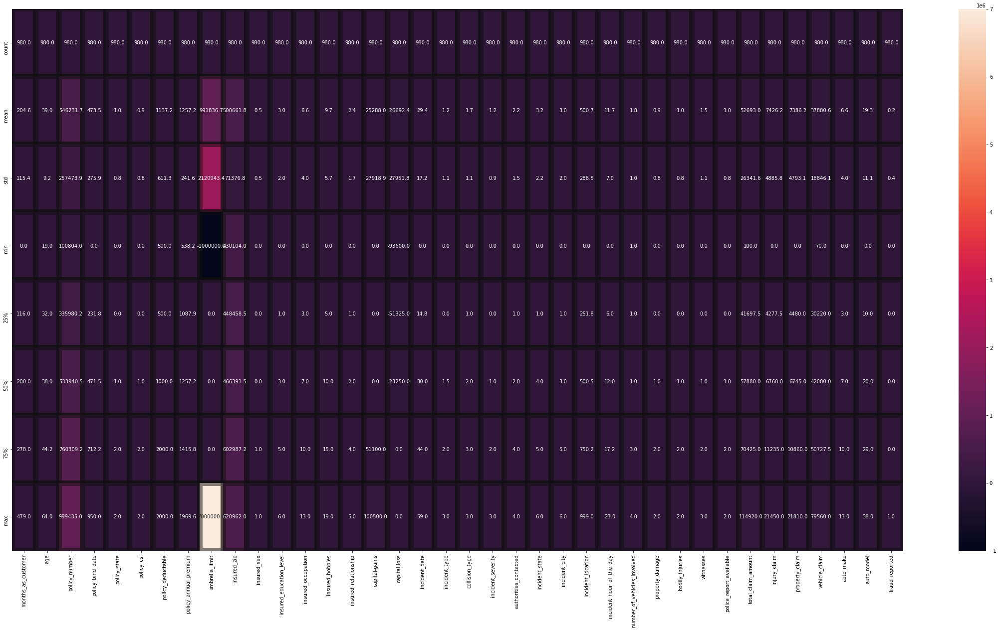

In [130]:
plt.figure(figsize=(40,20))
sn.heatmap(new_df.describe(), annot=True, linewidth=10, linecolor='#0f0f0f80', fmt='0.1f')

# Outcome of the Dataset Stats

In [131]:
# Total No of Rows and Columns are:
#   1000, 40
    

   #    months_as_customer                    age                         policy_number                     policy_bind_date                          policy_state                          policy_csl                          policy_deductable                                 policy_annual_premium                                        umbrella_limit                                       insured_zip                                             insured_sex                                             insured_education_level                                                   insured_occupation                                              insured_hobbies                                              insured_relationship                                               capital-gains                                          capital-loss                                                   incident_date                                               incident_type                                                    collision_type                                             incident_severity                                                  authorities_contacted                                               incident_state                                                    incident_city                                                        incident_location                                                        incident_hour_of_the_day                                                   number_of_vehicles_involved                                            property_damage                                                      bodily_injuries                                                      witnesses                                                 police_report_available                                              total_claim_amount                                             injury_claim                                            property_claim                                          vehicle_claim                                                auto_make                                               auto_model                                                fraud_reported
# count   980.000000                            980.000000                 980.000000                         980.000000                                980.000000                            980.000000                          980.000000                                        980.00000                                                    9.800000e+02                                         980.000000                                              980.000000                                              980.000000                                                                980.000000                                                      980.000000                                                   980.000000                                                         980.000000                                             980.000000                                                     980.000000                                                  980.000000                                                       980.000000                                                 980.000000                                                         980.000000                                                          980.000000                                                        980.000000                                                           980.000000                                                               980.000000                                                                 980.000000                                                             980.000000                                                           980.000000                                                           980.000000                                                980.000000                                                           980.000000                                                     980.000000                                              980.000000                                              980.000000                                                   980.000000                                              980.00000                                                 980.000000
# mean    204.613265                            38.973469                  546231.664286                      473.508163                                1.020408                              0.945918                            1137.24489                                        1257.206510                                                  9.918367e+05                                         500661.760204                                           0.465306                                                2.959184                                                                  6.643878                                                        9.743878                                                     2.417347                                                           25287.959184                                          -26692.448980                                                   29.380612                                                   1.177551                                                         1.666327                                                   1.183673                                                           2.163265                                                            3.242857                                                          2.982653                                                             500.683673                                                               11.688776                                                                  1.834694                                                               0.944898                                                             0.997959                                                             1.481633                                                  0.975510                                                             52693.010204                                                   7426.24489                                              7386.173469                                             37880.591837                                                 6.569388                                                19.25102                                                  0.244898
# std     115.420174                            9.184040                   257473.945100                      275.948832                                0.830713                              0.804821                            611.258486                                        241.568379                                                   2.120943e+06                                         71376.814338                                            0.499050                                                1.954113                                                                  4.018943                                                        5.692738                                                     1.682787                                                           27918.880339                                           27951.834834                                                   17.217322                                                   1.080568                                                         1.062831                                                   0.939943                                                           1.533380                                                            2.157771                                                          2.037119                                                             288.452024                                                               6.966436                                                                   1.018331                                                               0.812960                                                             0.817328                                                             1.112043                                                  0.809426                                                             26341.641716                                                   4885.829062                                             4793.054917                                             18846.130656                                                 4.028788                                                11.13132                                                  0.430246
# min     0.000000                              19.000000                  100804.000000                      0.000000                                  0.000000                              0.000000                            500.000000                                        538.170000                                                  -1.000000e+06                                         430104.000000                                           0.000000                                                0.000000                                                                  0.000000                                                        0.000000                                                     0.000000                                                           0.000000                                              -93600.000000                                                   0.000000                                                    0.000000                                                         0.000000                                                   0.000000                                                           0.000000                                                            0.000000                                                          0.000000                                                             0.000000                                                                 0.000000                                                                   1.000000                                                               0.000000                                                             0.000000                                                             0.000000                                                  0.000000                                                             100.000000                                                     0.000000                                                0.000000                                                70.000000                                                    0.000000                                                0.00000                                                   0.000000
# max     479.000000                            64.000000                  999435.000000                      950.000000                                2.000000                              2.000000                            2000.000000                                       1969.630000                                                  7.000000e+06                                         620962.000000                                           1.000000                                                6.000000                                                                  13.000000                                                       19.000000                                                    5.000000                                                           100500.000000                                          0.000000                                                       59.000000                                                   3.000000                                                         3.000000                                                   3.000000                                                           4.000000                                                            6.000000                                                          6.000000                                                             999.000000                                                               23.000000                                                                  4.000000                                                               2.000000                                                             2.000000                                                             3.000000                                                  2.000000                                                             114920.000000                                                  21450.000000                                            21810.000000                                            79560.000000                                                 13.000000                                               38.00000                                                  1.000000   
    

# Correlation Heatmap

In [132]:
cor=new_df.corr()
cor

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported
months_as_customer,1.000000,0.922960,0.061267,0.055337,-0.007183,-0.021855,0.031041,-0.003814,0.018213,0.029572,0.059644,-0.000731,0.006925,-0.089358,0.071492,0.007468,0.023041,-0.004372,-0.016746,-0.023069,-0.064094,0.013782,0.015811,-0.006601,-0.011966,0.066198,0.011831,0.002374,-0.007674,0.063574,0.024521,0.058761,0.065062,0.036660,0.055941,0.049734,0.005130,0.021285
age,0.922960,1.000000,0.062332,0.057015,-0.020012,-0.013323,0.032036,0.005330,0.013256,0.035864,0.073790,0.001647,0.014798,-0.079099,0.076129,-0.004529,0.012860,0.000775,-0.026286,-0.022674,-0.064396,0.018441,0.012644,-0.006685,-0.009067,0.083720,0.020391,-0.006900,-0.012254,0.056360,0.019424,0.067812,0.077149,0.062375,0.058918,0.033757,0.015322,0.013279
policy_number,0.061267,0.062332,1.000000,0.054617,0.071343,0.042129,-0.009812,0.028686,-0.000145,0.004531,0.007069,-0.033767,-0.014476,0.031887,0.021378,0.013628,-0.005587,0.045433,0.007872,-0.009819,-0.016051,0.021092,-0.014040,-0.026174,0.015872,-0.000897,0.007744,0.001889,-0.006242,-0.005587,0.029478,-0.016199,-0.006386,-0.011147,-0.018152,0.016494,0.064599,-0.036887
policy_bind_date,0.055337,0.057015,0.054617,1.000000,0.015488,0.003408,0.001466,-0.041670,-0.020458,-0.044430,0.045752,0.044135,0.013861,0.026070,0.017479,-0.009286,-0.019595,0.012079,0.003784,-0.001002,-0.053225,-0.033872,0.047110,0.026841,0.000919,-0.007351,-0.004604,-0.004560,-0.048677,-0.010445,-0.031970,0.005666,0.012931,0.000816,0.004359,-0.020202,0.004594,0.061472
policy_state,-0.007183,-0.020012,0.071343,0.015488,1.000000,0.001653,0.017612,0.015089,-0.010921,0.020669,-0.018002,-0.027173,-0.025357,-0.039501,-0.017060,0.068619,-0.031926,0.030594,0.032373,0.028545,-0.028353,-0.014647,0.019456,-0.002809,0.030864,0.021926,-0.045514,0.006204,0.012097,0.025838,0.072142,-0.014693,-0.048188,-0.006420,-0.006411,0.010259,-0.018008,0.034587
policy_csl,-0.021855,-0.013323,0.042129,0.003408,0.001653,1.000000,0.009912,0.032654,0.013504,0.005593,-0.003405,0.008337,0.016461,-0.003695,-0.034603,0.009786,-0.035589,-0.007506,0.005180,-0.027089,0.017195,0.051030,0.035804,0.014380,0.050719,0.003918,-0.014658,-0.020171,0.001385,0.071361,-0.005171,-0.054128,-0.080098,-0.042876,-0.043987,-0.009395,0.042905,-0.032509
policy_deductable,0.031041,0.032036,-0.009812,0.001466,0.017612,0.009912,1.000000,-0.008300,0.013471,-0.004399,-0.006977,0.014101,-0.053888,-0.001923,-0.019000,0.031673,-0.019601,-0.025156,-0.032291,-0.033994,-0.016363,0.002769,0.000647,-0.047304,-0.010569,0.064732,0.046331,0.009067,-0.037263,0.071709,0.030542,0.023835,0.038459,0.071031,0.005279,-0.028032,-0.002591,0.015774
policy_annual_premium,-0.003814,0.005330,0.028686,-0.041670,0.015089,0.032654,-0.008300,1.000000,-0.014107,0.047651,0.041312,-0.021400,0.027827,-0.014226,0.004417,-0.006807,0.033133,0.028357,0.051606,0.027938,-0.013911,-0.054425,0.048647,0.047771,0.009026,-0.006448,-0.044544,0.087308,0.027837,0.003433,0.023249,-0.000223,-0.024119,-0.014073,0.009521,0.009311,-0.038226,-0.012686
umbrella_limit,0.018213,0.013256,-0.000145,-0.020458,-0.010921,0.013504,0.013471,-0.014107,1.000000,0.004481,0.018068,-0.030887,0.003973,-0.034098,0.095972,-0.022753,-0.025844,-0.027187,0.034951,-0.028851,-0.001297,0.022396,-0.081479,0.039685,0.029566,-0.022571,-0.041298,-0.070757,0.047719,-0.001363,-0.037006,-0.047348,-0.046298,-0.021380,-0.048740,0.012857,0.015360,0.044729
insured_zip,0.029572,0.035864,0.00

<AxesSubplot:>

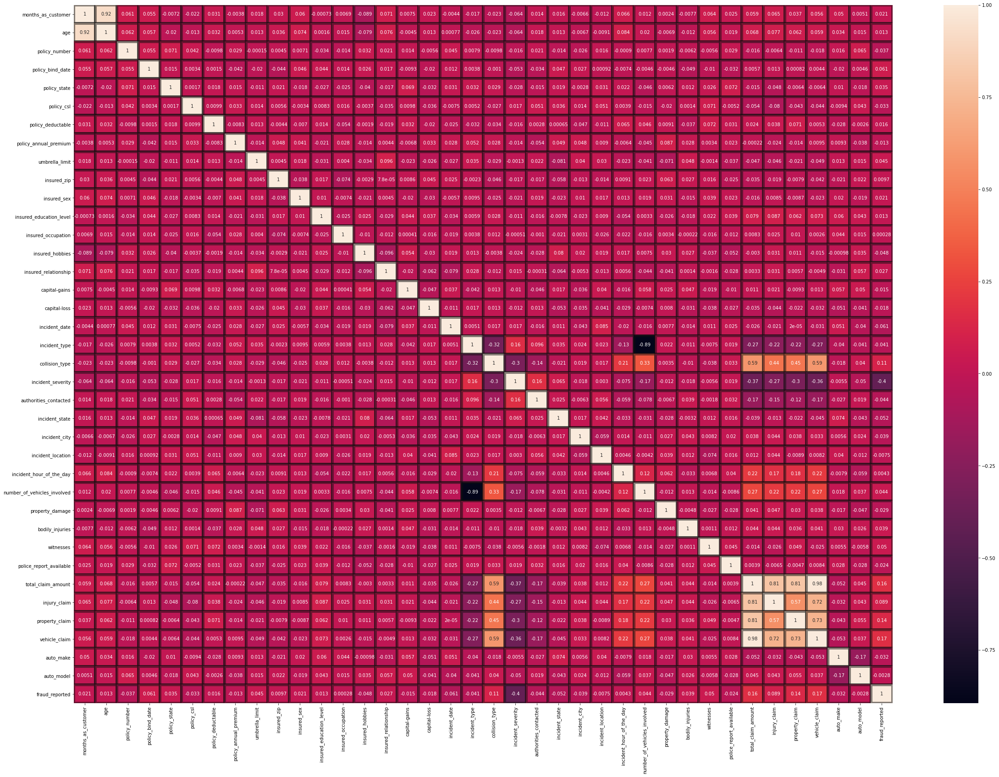

In [133]:
plt.figure(figsize=(40,28))
sn.heatmap(cor, annot=True, linewidth=5, linecolor='#0f0f0f80')

* In the above plot we observe that vehicle_claim has the best correlation with Target column

# To check the columns +ve and -ve correlated

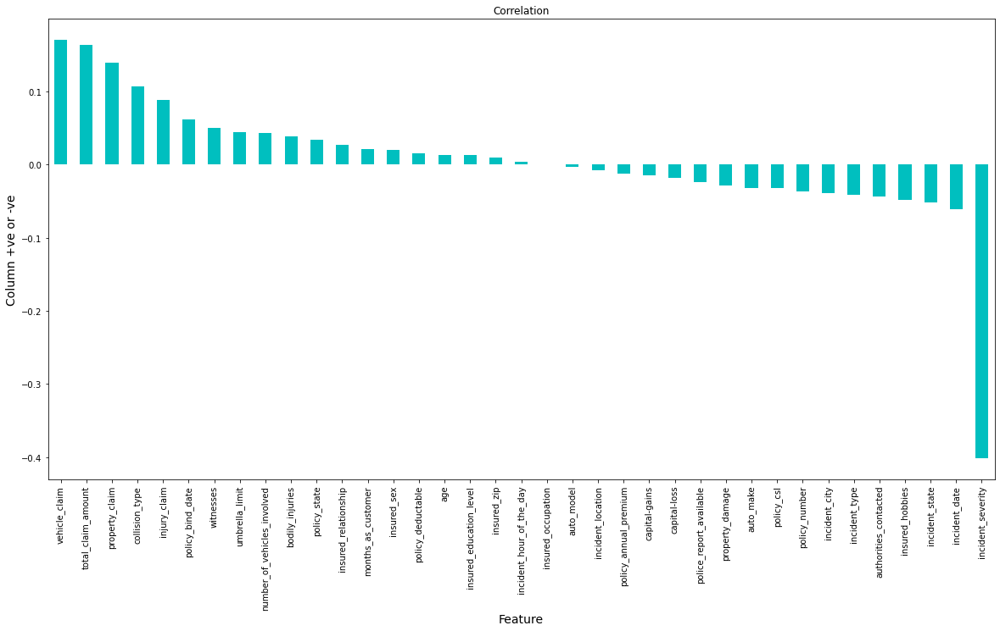

In [134]:
plt.figure(figsize=(20,10))
new_df.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar', color='c')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('Column +ve or -ve', fontsize=14)
plt.title('Correlation', fontsize=12)
plt.show()

* In the above plot we observe that Columns ['Vehicle_claim', 'total_claim_amount', 'collision_type', 'injury_claim', 'policy_bind_date', 'whithness', 'umbrella_limit', 'Number_of_vehicles_involved', 'bodily_injuries','policy_state', 'insured_relationship', 'months_as_customer', 'insured_sex', 'policy_deductable', 'age', 'insured_education_level', 'insured_zip', 'incident_hour_of_day'] are +vely correlated  and Columns['auto_model', 'income_location', 'policy_annual_premium', 'capital_gains', 'capital_loss', 'policy_report_available', 'property_damage', 'auto_make', 'policy_csl', 'incident_type', 'authorities_contacted', 'insured_hobbies', 'incident_date', 'incident_state', 'incident_severity'] are all -vely correlated with Target column

* From the above plot we confirm that Vehicle_claim has the best correlation with Target column

# DataPreprocessing

# Skewness check and Removal

In [135]:
new_df.skew()

months_as_customer             0.362608
age                            0.475385
policy_number                  0.036283
policy_bind_date               0.006386
policy_state                  -0.038157
policy_csl                     0.098248
policy_deductable              0.476090
policy_annual_premium          0.035964
umbrella_limit                 1.801424
insured_zip                    0.837283
insured_sex                    0.139324
insured_education_level        0.006286
insured_occupation            -0.055360
insured_hobbies               -0.061488
insured_relationship           0.078339
capital-gains                  0.466619
capital-loss                  -0.376884
incident_date                  0.002604
incident_type                  0.090563
collision_type                -0.194015
incident_severity              0.277726
authorities_contacted         -0.114044
incident_state                -0.149255
incident_city                  0.043882
incident_location             -0.003369


In [136]:
import scipy.stats as Stat
import matplotlib.pyplot as plt
import pylab

In [137]:
def Plotter(new_df,feature):
    plt.figure(figsize=(10,6))
    plt.subplot(1,2,1)
    new_df[feature].hist()
    plt.subplot(1,2,2)
    Stat.probplot(new_df[feature],dist='norm',plot=pylab)
    plt.show()

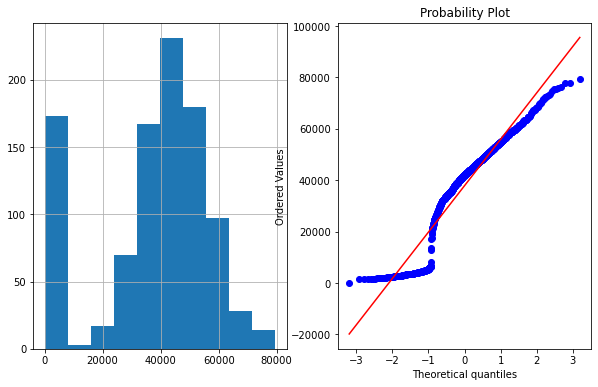

In [138]:
Plotter(new_df,'vehicle_claim')

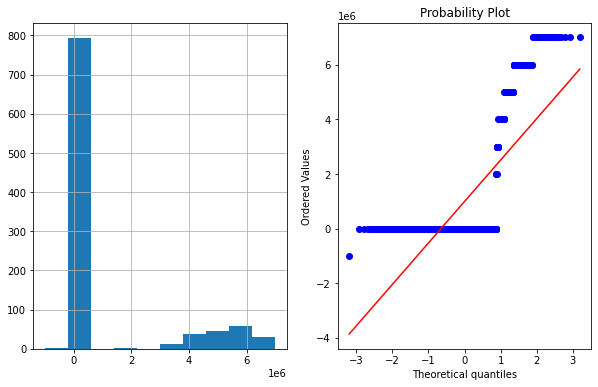

In [139]:
Plotter(new_df,'umbrella_limit')

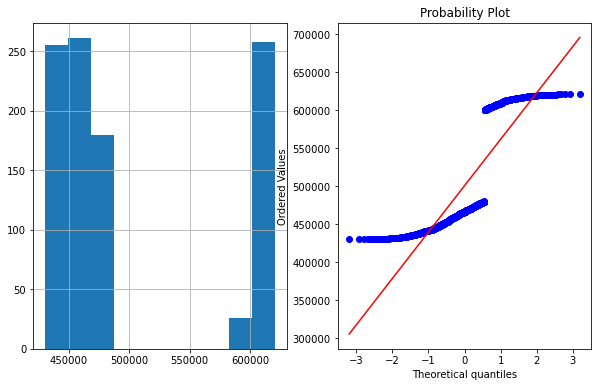

In [140]:
Plotter(new_df,'insured_zip')

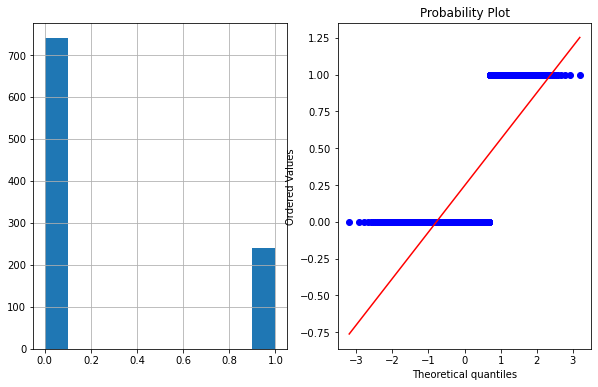

In [141]:
Plotter(new_df,'fraud_reported')

* From the above plots we observe that columns vehicle_claim have gaussian distribution we remove its skewness and the rest of the columns balancing should be performed

In [142]:
from sklearn.preprocessing import PowerTransformer

In [143]:
new_df['vehicle_claim']=PowerTransformer('yeo-johnson').fit_transform(new_df[['vehicle_claim']])

In [144]:
new_df.skew()

months_as_customer             0.362608
age                            0.475385
policy_number                  0.036283
policy_bind_date               0.006386
policy_state                  -0.038157
policy_csl                     0.098248
policy_deductable              0.476090
policy_annual_premium          0.035964
umbrella_limit                 1.801424
insured_zip                    0.837283
insured_sex                    0.139324
insured_education_level        0.006286
insured_occupation            -0.055360
insured_hobbies               -0.061488
insured_relationship           0.078339
capital-gains                  0.466619
capital-loss                  -0.376884
incident_date                  0.002604
incident_type                  0.090563
collision_type                -0.194015
incident_severity              0.277726
authorities_contacted         -0.114044
incident_state                -0.149255
incident_city                  0.043882
incident_location             -0.003369


# Balancing Columns with Imbalances to avoid Bias

In [145]:
UL = new_df.columns.tolist()
UL = [col for col in UL if col not in ['umbrella_limit']]

target1 = 'umbrella_limit'

state = np.random.RandomState(42)
a = new_df[UL]
b = new_df[target1]

a_outliers = state.uniform(low=0, high=1, size=(a.shape[0], a.shape[1]))
print(a.shape)

(980, 37)


In [146]:
BT = new_df.columns.tolist()
BT = [col for col in BT if col not in ['incident_type']]

target2 = 'incident_type'

state = np.random.RandomState(42)
c = new_df[BT]
d = new_df[target2]

c_outliers = state.uniform(low=0, high=1, size=(c.shape[0], c.shape[1]))
print(c.shape)

(980, 37)


In [147]:
FR = new_df.columns.tolist()
FR = [col for col in FR if col not in ['fraud_reported']]

target3 = 'fraud_reported'

state = np.random.RandomState(42)
e = new_df[FR]
f = new_df[target3]

a_outliers = state.uniform(low=0, high=1, size=(e.shape[0], e.shape[1]))
print(e.shape)

(980, 37)


In [148]:
EF = new_df.columns.tolist()
EF = [col for col in EF if col not in ['number_of_vehicles_involved']]

target4 = 'number_of_vehicles_involved'

state = np.random.RandomState(42)
g = new_df[EF]
h = new_df[target4]

g_outliers = state.uniform(low=0, high=1, size=(g.shape[0], g.shape[1]))
print(g.shape)

(980, 37)


Text(0, 0.5, 'Frequency')

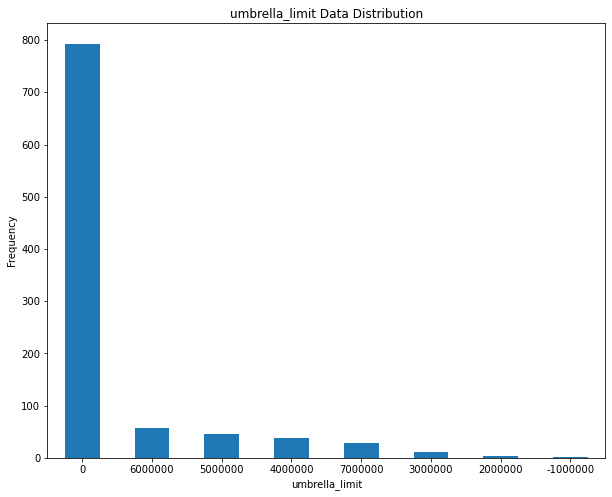

In [149]:
plt.figure(figsize=[10,8])
count_classes = pd.value_counts(new_df['umbrella_limit'], sort = True)
count_classes.plot(kind='bar', rot=0)
plt.title("umbrella_limit Data Distribution")


plt.xlabel("umbrella_limit")
plt.ylabel("Frequency")

Text(0, 0.5, 'Frequency')

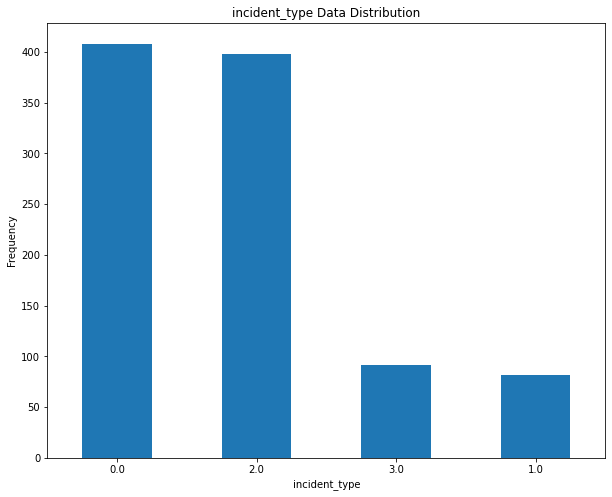

In [150]:
plt.figure(figsize=[10,8])
count_classes = pd.value_counts(new_df['incident_type'], sort = True)
count_classes.plot(kind='bar', rot=0)
plt.title("incident_type Data Distribution")


plt.xlabel("incident_type")
plt.ylabel("Frequency")

Text(0, 0.5, 'Frequency')

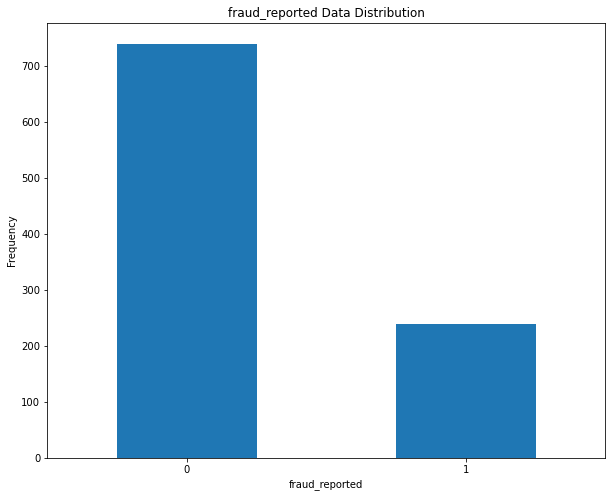

In [151]:
plt.figure(figsize=[10,8])
count_classes = pd.value_counts(new_df['fraud_reported'], sort = True)
count_classes.plot(kind='bar', rot=0)
plt.title("fraud_reported Data Distribution")


plt.xlabel("fraud_reported")
plt.ylabel("Frequency")

Text(0, 0.5, 'Frequency')

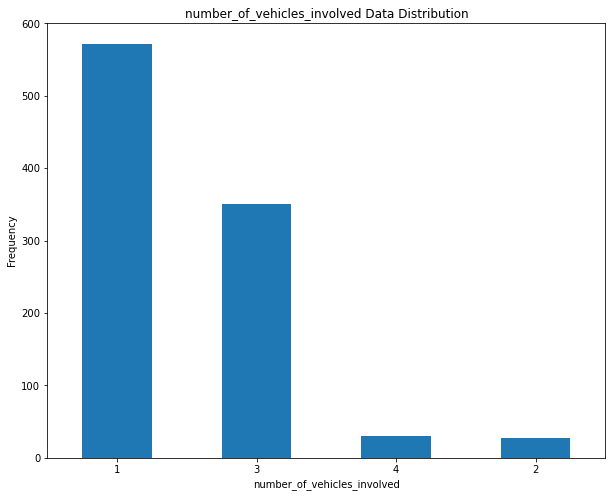

In [152]:
plt.figure(figsize=[10,8])
count_classes = pd.value_counts(new_df['number_of_vehicles_involved'], sort = True)
count_classes.plot(kind='bar', rot=0)
plt.title("number_of_vehicles_involved Data Distribution")


plt.xlabel("number_of_vehicles_involved")
plt.ylabel("Frequency")

In [153]:
NO1 = new_df[new_df['umbrella_limit']==0]
NO1.shape

(793, 38)

In [154]:
NO2 = new_df[new_df['umbrella_limit']==6000000]
NO2.shape

(57, 38)

In [155]:
NO3 = new_df[new_df['umbrella_limit']==5000000]
NO3.shape

(46, 38)

In [156]:
NO4 = new_df[new_df['umbrella_limit']==4000000]
NO4.shape

(39, 38)

In [157]:
NO5 = new_df[new_df['umbrella_limit']==7000000]
NO5.shape

(29, 38)

In [158]:
NO6 = new_df[new_df['umbrella_limit']==3000000]
NO6.shape

(12, 38)

In [159]:
NO7 = new_df[new_df['umbrella_limit']==2000000]
NO7.shape

(3, 38)

In [160]:
NO8 = new_df[new_df['umbrella_limit']==-1000000]
NO8.shape

(1, 38)

In [161]:
NO9 = new_df[new_df['fraud_reported']==0]
NO9.shape

(740, 38)

In [162]:
NO10 = new_df[new_df['fraud_reported']==-1]
NO10.shape

(0, 38)

In [163]:
NO11 = new_df[new_df['incident_type']==0.0]
NO11.shape

(408, 38)

In [164]:
NO12 = new_df[new_df['incident_type']==1.0]
NO12.shape

(82, 38)

In [165]:
NO13 = new_df[new_df['incident_type']==2.0]
NO13.shape

(398, 38)

In [166]:
NO14 = new_df[new_df['incident_type']==3.0]
NO14.shape

(92, 38)

In [167]:
NO15 = new_df[new_df['number_of_vehicles_involved']==1]
NO15.shape

(572, 38)

In [168]:
NO15 = new_df[new_df['number_of_vehicles_involved']==2]
NO15.shape

(28, 38)

In [169]:
NO16 = new_df[new_df['number_of_vehicles_involved']==3]
NO16.shape

(350, 38)

In [170]:
NO17 = new_df[new_df['number_of_vehicles_involved']==4]
NO17.shape

(30, 38)

In [171]:
from imblearn.over_sampling import RandomOverSampler

In [172]:
os = RandomOverSampler()

In [173]:
A_train_res, B_train_res = os.fit_resample(a, b)

In [174]:
C_train_res, D_train_res = os.fit_resample(c, d)

In [175]:
E_train_res, F_train_res = os.fit_resample(e, f)

In [176]:
G_train_res, H_train_res = os.fit_resample(g, h)

In [177]:
from collections import Counter

In [178]:
print('Original umbrella_limit dataset shape{}'.format(Counter(b)))

Original umbrella_limit dataset shapeCounter({0: 793, 6000000: 57, 5000000: 46, 4000000: 39, 7000000: 29, 3000000: 12, 2000000: 3, -1000000: 1})


In [179]:
print('Original incident_type dataset shape{}'.format(Counter(d)))

Original incident_type dataset shapeCounter({0.0: 408, 2.0: 398, 3.0: 92, 1.0: 82})


In [180]:
print('Original fraud_reported dataset shape{}'.format(Counter(f)))

Original fraud_reported dataset shapeCounter({0: 740, 1: 240})


In [181]:
print('Original number_of_vehicles_involved dataset shape{}'.format(Counter(h)))

Original number_of_vehicles_involved dataset shapeCounter({1: 572, 3: 350, 4: 30, 2: 28})


In [182]:
print('Resampled umbrella_limit dataset shape{}'.format(Counter(B_train_res)))

Resampled umbrella_limit dataset shapeCounter({0: 793, 5000000: 793, 6000000: 793, 4000000: 793, 3000000: 793, 7000000: 793, -1000000: 793, 2000000: 793})


In [183]:
print('Resampled incident_type dataset shape{}'.format(Counter(D_train_res)))

Resampled incident_type dataset shapeCounter({2.0: 408, 3.0: 408, 0.0: 408, 1.0: 408})


In [184]:
print('Resampled fraud_reported dataset shape{}'.format(Counter(F_train_res)))

Resampled fraud_reported dataset shapeCounter({1: 740, 0: 740})


In [185]:
print('Resampled number_of_vehicles_involved dataset shape{}'.format(Counter(H_train_res)))

Resampled number_of_vehicles_involved dataset shapeCounter({1: 572, 3: 572, 4: 572, 2: 572})


# Scaling DataFrame

In [186]:
from sklearn.preprocessing import StandardScaler

In [187]:
for col in new_df.iloc[:,:-1]:
    sc = StandardScaler()
    new_df.iloc[:,:-1][col] = sc.fit_transform(new_df.iloc[:,:-1][[col]])

# Separating the Features columns and Target Column

In [188]:
features=new_df.drop("fraud_reported",axis=1)
target=new_df["fraud_reported"]

# Classification Test Model 1

In [189]:
from sklearn.metrics import accuracy_score
from sklearn.metrics  import f1_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
LR=LogisticRegression()

In [190]:
for i in range(0,100):
    features_train, features_test, target_train, target_test = train_test_split(features, target, test_size=0.25, random_state=i)
    LR.fit(features_train, target_train)
    pred_train=LR.predict(features_train)
    pred_test=LR.predict(features_test)
    print(f"At random state {i},the training accuracy is: {f1_score(target_train, pred_train, average='micro')}")
    print(f"At random state {i},the testing accuracy is: {f1_score(target_test, pred_test, average='micro')}")
    print("\n")

At random state 0,the training accuracy is: 0.7700680272108843
At random state 0,the testing accuracy is: 0.7224489795918367


At random state 1,the training accuracy is: 0.746938775510204
At random state 1,the testing accuracy is: 0.7877551020408163


At random state 2,the training accuracy is: 0.764625850340136
At random state 2,the testing accuracy is: 0.7306122448979592


At random state 3,the training accuracy is: 0.7510204081632653
At random state 3,the testing accuracy is: 0.7714285714285715


At random state 4,the training accuracy is: 0.7482993197278912
At random state 4,the testing accuracy is: 0.783673469387755


At random state 5,the training accuracy is: 0.7619047619047619
At random state 5,the testing accuracy is: 0.7551020408163265


At random state 6,the training accuracy is: 0.7482993197278912
At random state 6,the testing accuracy is: 0.779591836734694


At random state 7,the training accuracy is: 0.7510204081632653
At random state 7,the testing accuracy is: 0.7755102

At random state 68,the training accuracy is: 0.745578231292517
At random state 68,the testing accuracy is: 0.7959183673469388


At random state 69,the training accuracy is: 0.7496598639455783
At random state 69,the testing accuracy is: 0.7877551020408163


At random state 70,the training accuracy is: 0.7523809523809524
At random state 70,the testing accuracy is: 0.783673469387755


At random state 71,the training accuracy is: 0.7619047619047619
At random state 71,the testing accuracy is: 0.746938775510204


At random state 72,the training accuracy is: 0.7700680272108843
At random state 72,the testing accuracy is: 0.7142857142857143


At random state 73,the training accuracy is: 0.7591836734693876
At random state 73,the testing accuracy is: 0.7591836734693876


At random state 74,the training accuracy is: 0.7510204081632653
At random state 74,the testing accuracy is: 0.7714285714285715


At random state 75,the training accuracy is: 0.7551020408163265
At random state 75,the testing accur

In [191]:
features_train, features_test, target_train, target_test=train_test_split(features, target, test_size=0.25, random_state=1)

In [192]:
LR.fit(features_train, target_train)

LogisticRegression()

In [193]:
pred_test=LR.predict(features_test)

In [194]:
accuracy_score(target_test, pred_test)

0.7877551020408163

# Here we observe that we get : 78% accuracy for this model

In [195]:
f1_score(target_test, pred_test, average='micro')

0.7877551020408163

# Here we confirm that this model gives : 78% accuracy assuming average as micro argument

# Cross-Validation the Model 1

In [196]:
from sklearn.model_selection import cross_val_score

In [197]:
lin_score = cross_val_score(LR,features,target,cv=5, scoring='neg_mean_absolute_error')
lin_score_n = -lin_score
lin_score_n

array([0.24489796, 0.23979592, 0.25510204, 0.24489796, 0.24489796])

In [198]:
np.mean(lin_score_n)

0.24591836734693878

In [199]:
cross_val_score(LR,features,target,cv=5).mean()

0.7540816326530612

# Here we find the mean_score is at : 0.24591836734693878 % which is < 5% and cross val score is at 75 % which is good for our model

# Classification Test Model 2

In [200]:
from sklearn.metrics import accuracy_score
from sklearn.metrics  import f1_score
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
SVC=SVC()

In [201]:
for i in range(0,100):
    features_train, features_test, target_train, target_test = train_test_split(features, target, test_size=0.25, random_state=i)
    SVC.fit(features_train, target_train)
    pred_train=SVC.predict(features_train)
    pred_test=SVC.predict(features_test)
    print(f"At random state {i},the training accuracy is: {f1_score(target_train, pred_train, average='micro')}")
    print(f"At random state {i},the testing accuracy is: {f1_score(target_test, pred_test, average='micro')}")
    print("\n")

At random state 0,the training accuracy is: 0.765986394557823
At random state 0,the testing accuracy is: 0.7224489795918367


At random state 1,the training accuracy is: 0.7442176870748299
At random state 1,the testing accuracy is: 0.7877551020408163


At random state 2,the training accuracy is: 0.7632653061224491
At random state 2,the testing accuracy is: 0.7306122448979592


At random state 3,the training accuracy is: 0.7496598639455783
At random state 3,the testing accuracy is: 0.7714285714285715


At random state 4,the training accuracy is: 0.745578231292517
At random state 4,the testing accuracy is: 0.783673469387755


At random state 5,the training accuracy is: 0.7564625850340136
At random state 5,the testing accuracy is: 0.7510204081632653


At random state 6,the training accuracy is: 0.7482993197278912
At random state 6,the testing accuracy is: 0.7755102040816326


At random state 7,the training accuracy is: 0.7496598639455783
At random state 7,the testing accuracy is: 0.771428

At random state 66,the training accuracy is: 0.7496598639455783
At random state 66,the testing accuracy is: 0.7714285714285715


At random state 67,the training accuracy is: 0.745578231292517
At random state 67,the testing accuracy is: 0.783673469387755


At random state 68,the training accuracy is: 0.7374149659863947
At random state 68,the testing accuracy is: 0.8081632653061225


At random state 69,the training accuracy is: 0.745578231292517
At random state 69,the testing accuracy is: 0.783673469387755


At random state 70,the training accuracy is: 0.745578231292517
At random state 70,the testing accuracy is: 0.783673469387755


At random state 71,the training accuracy is: 0.7578231292517007
At random state 71,the testing accuracy is: 0.746938775510204


At random state 72,the training accuracy is: 0.765986394557823
At random state 72,the testing accuracy is: 0.7224489795918367


At random state 73,the training accuracy is: 0.7537414965986393
At random state 73,the testing accuracy i

In [202]:
features_train, features_test, target_train, target_test=train_test_split(features, target, test_size=0.25, random_state=1)

In [203]:
SVC.fit(features_train, target_train)

SVC()

In [204]:
pred_test=SVC.predict(features_test)

In [205]:
accuracy_score(target_test, pred_test)

0.7877551020408163

# Here we observe that we get : 78% accuracy for this model

In [206]:
f1_score(target_test, pred_test, average='micro')

0.7877551020408163

# Here we confirm that this model gives : 78% accuracy assuming average as micro argument

# Cross-Validation the Model 2

In [207]:
from sklearn.model_selection import cross_val_score

In [208]:
lin_score = cross_val_score(SVC,features,target,cv=5, scoring='neg_mean_absolute_error')
lin_score_n = -lin_score
lin_score_n

array([0.24489796, 0.24489796, 0.24489796, 0.24489796, 0.24489796])

In [209]:
np.mean(lin_score_n)

0.24489795918367346

In [210]:
cross_val_score(SVC,features,target,cv=5).mean()

0.7551020408163265

# Here we find the mean_score is at : 0.24489795918367346 % which is < 5% and cross val score is at 75 % which is good for our model

# Classification Test Model 3

In [211]:
from sklearn.metrics import accuracy_score
from sklearn.metrics  import f1_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
DTC=GradientBoostingClassifier()

In [212]:
for i in range(0,100):
    features_train, features_test, target_train, target_test = train_test_split(features, target, test_size=0.25, random_state=i)
    DTC.fit(features_train, target_train)
    pred_train=DTC.predict(features_train)
    pred_test=DTC.predict(features_test)
    print(f"At random state {i},the training accuracy is: {f1_score(target_train, pred_train, average='micro')}")
    print(f"At random state {i},the testing accuracy is: {f1_score(target_test, pred_test, average='micro')}")
    print("\n")

At random state 0,the training accuracy is: 0.9782312925170068
At random state 0,the testing accuracy is: 0.7877551020408163


At random state 1,the training accuracy is: 0.9768707482993197
At random state 1,the testing accuracy is: 0.8653061224489796


At random state 2,the training accuracy is: 0.9727891156462585
At random state 2,the testing accuracy is: 0.7918367346938775


At random state 3,the training accuracy is: 0.9673469387755103
At random state 3,the testing accuracy is: 0.8367346938775511


At random state 4,the training accuracy is: 0.9687074829931973
At random state 4,the testing accuracy is: 0.8204081632653062


At random state 5,the training accuracy is: 0.9755102040816327
At random state 5,the testing accuracy is: 0.8163265306122449


At random state 6,the training accuracy is: 0.9768707482993197
At random state 6,the testing accuracy is: 0.8408163265306122


At random state 7,the training accuracy is: 0.9755102040816327
At random state 7,the testing accuracy is: 0.787

At random state 64,the training accuracy is: 0.9782312925170068
At random state 64,the testing accuracy is: 0.8122448979591836


At random state 65,the training accuracy is: 0.9727891156462585
At random state 65,the testing accuracy is: 0.8285714285714286


At random state 66,the training accuracy is: 0.9795918367346939
At random state 66,the testing accuracy is: 0.8122448979591836


At random state 67,the training accuracy is: 0.9782312925170068
At random state 67,the testing accuracy is: 0.8244897959183674


At random state 68,the training accuracy is: 0.9741496598639455
At random state 68,the testing accuracy is: 0.8285714285714286


At random state 69,the training accuracy is: 0.9809523809523809
At random state 69,the testing accuracy is: 0.8653061224489796


At random state 70,the training accuracy is: 0.9782312925170068
At random state 70,the testing accuracy is: 0.8081632653061225


At random state 71,the training accuracy is: 0.9795918367346939
At random state 71,the testing ac

In [213]:
features_train, features_test, target_train, target_test=train_test_split(features, target, test_size=0.25, random_state=1)

In [214]:
DTC.fit(features_train, target_train)

GradientBoostingClassifier()

In [215]:
pred_test=DTC.predict(features_test)

In [216]:
accuracy_score(target_test, pred_test)

0.8612244897959184

# Here we observe that we get : 86% accuracy for this model

In [217]:
f1_score(target_test, pred_test, average='micro')

0.8612244897959184

# Here we confirm that this model gives : 86% accuracy assuming average as micro argument

# Cross-Validation the Model 3

In [218]:
from sklearn.model_selection import cross_val_score

In [219]:
lin_score = cross_val_score(DTC,features,target,cv=5, scoring='neg_mean_absolute_error')
lin_score_n = -lin_score
lin_score_n

array([0.17346939, 0.20918367, 0.17857143, 0.14795918, 0.13265306])

In [220]:
np.mean(lin_score_n)

0.16836734693877553

In [221]:
cross_val_score(DTC,features,target,cv=5).mean()

0.8306122448979594

# Here we find the mean_score is at : 0.16938775510204082 % which is < 5% and cross val score is at 83% which is good for our model

# Classification Test Model 4

In [222]:
from sklearn.metrics import accuracy_score
from sklearn.metrics  import f1_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import SGDClassifier
NB=SGDClassifier()

In [223]:
for i in range(0,100):
    features_train, features_test, target_train, target_test = train_test_split(features, target, test_size=0.25, random_state=i)
    NB.fit(features_train, target_train)
    pred_train=NB.predict(features_train)
    pred_test=NB.predict(features_test)
    print(f"At random state {i},the training accuracy is: {f1_score(target_train, pred_train, average='micro')}")
    print(f"At random state {i},the testing accuracy is: {f1_score(target_test, pred_test, average='micro')}")
    print("\n")

At random state 0,the training accuracy is: 0.3931972789115647
At random state 0,the testing accuracy is: 0.4122448979591837


At random state 1,the training accuracy is: 0.745578231292517
At random state 1,the testing accuracy is: 0.7877551020408163


At random state 2,the training accuracy is: 0.7619047619047619
At random state 2,the testing accuracy is: 0.7306122448979592


At random state 3,the training accuracy is: 0.7496598639455783
At random state 3,the testing accuracy is: 0.7714285714285715


At random state 4,the training accuracy is: 0.7442176870748299
At random state 4,the testing accuracy is: 0.783673469387755


At random state 5,the training accuracy is: 0.7564625850340136
At random state 5,the testing accuracy is: 0.7510204081632653


At random state 6,the training accuracy is: 0.636734693877551
At random state 6,the testing accuracy is: 0.6163265306122448


At random state 7,the training accuracy is: 0.6816326530612244
At random state 7,the testing accuracy is: 0.665306

At random state 72,the testing accuracy is: 0.726530612244898


At random state 73,the training accuracy is: 0.7523809523809524
At random state 73,the testing accuracy is: 0.7591836734693876


At random state 74,the training accuracy is: 0.7537414965986393
At random state 74,the testing accuracy is: 0.7755102040816326


At random state 75,the training accuracy is: 0.7523809523809524
At random state 75,the testing accuracy is: 0.7591836734693876


At random state 76,the training accuracy is: 0.5537414965986395
At random state 76,the testing accuracy is: 0.4897959183673469


At random state 77,the training accuracy is: 0.7496598639455783
At random state 77,the testing accuracy is: 0.7673469387755102


At random state 78,the training accuracy is: 0.7551020408163265
At random state 78,the testing accuracy is: 0.7591836734693876


At random state 79,the training accuracy is: 0.7510204081632653
At random state 79,the testing accuracy is: 0.7714285714285715


At random state 80,the training a

In [224]:
features_train, features_test, target_train, target_test=train_test_split(features, target, test_size=0.25, random_state=1)

In [225]:
NB.fit(features_train, target_train)

SGDClassifier()

In [226]:
pred_test=NB.predict(features_test)

In [227]:
accuracy_score(target_test, pred_test)

0.7877551020408163

# Here we observe that we get : 78% accuracy for this model

In [228]:
f1_score(target_test, pred_test, average='micro')

0.7877551020408163

# Here we confirm that this model gives : 78% accuracy assuming average as micro argument

# Cross-Validation the Model 4

In [229]:
from sklearn.model_selection import cross_val_score

In [230]:
lin_score = cross_val_score(NB,features,target,cv=5, scoring='neg_mean_absolute_error')
lin_score_n = -lin_score
lin_score_n

array([0.24489796, 0.35204082, 0.40306122, 0.24489796, 0.69387755])

In [231]:
np.mean(lin_score_n)

0.38775510204081637

In [232]:
cross_val_score(NB,features,target,cv=5).mean()

0.6724489795918366

# Here we find the mean_score is at : 0.31428571428571433 % which is < 5% and cross val score is at 73% which is good for our model

# Classification Test Model 5

In [233]:
from sklearn.metrics import accuracy_score
from sklearn.metrics  import f1_score
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
LGBM=GaussianNB()

In [234]:
for i in range(0,100):
    features_train, features_test, target_train, target_test = train_test_split(features, target, test_size=0.25, random_state=i)
    LGBM.fit(features_train, target_train)
    pred_train=LGBM.predict(features_train)
    pred_test=LGBM.predict(features_test)
    print(f"At random state {i},the training accuracy is: {f1_score(target_train, pred_train, average='micro')}")
    print(f"At random state {i},the testing accuracy is: {f1_score(target_test, pred_test, average='micro')}")
    print("\n")

At random state 0,the training accuracy is: 0.7551020408163265
At random state 0,the testing accuracy is: 0.7020408163265306


At random state 1,the training accuracy is: 0.7238095238095238
At random state 1,the testing accuracy is: 0.779591836734694


At random state 2,the training accuracy is: 0.7578231292517007
At random state 2,the testing accuracy is: 0.7183673469387754


At random state 3,the training accuracy is: 0.7401360544217688
At random state 3,the testing accuracy is: 0.7510204081632653


At random state 4,the training accuracy is: 0.726530612244898
At random state 4,the testing accuracy is: 0.7428571428571429


At random state 5,the training accuracy is: 0.7183673469387754
At random state 5,the testing accuracy is: 0.7142857142857143


At random state 6,the training accuracy is: 0.7306122448979592
At random state 6,the testing accuracy is: 0.7551020408163265


At random state 7,the training accuracy is: 0.7319727891156461
At random state 7,the testing accuracy is: 0.71020

At random state 74,the testing accuracy is: 0.7673469387755102


At random state 75,the training accuracy is: 0.7496598639455783
At random state 75,the testing accuracy is: 0.7387755102040816


At random state 76,the training accuracy is: 0.7306122448979592
At random state 76,the testing accuracy is: 0.6693877551020408


At random state 77,the training accuracy is: 0.7360544217687074
At random state 77,the testing accuracy is: 0.7061224489795919


At random state 78,the training accuracy is: 0.7278911564625851
At random state 78,the testing accuracy is: 0.7306122448979592


At random state 79,the training accuracy is: 0.7428571428571429
At random state 79,the testing accuracy is: 0.7591836734693876


At random state 80,the training accuracy is: 0.7306122448979592
At random state 80,the testing accuracy is: 0.746938775510204


At random state 81,the training accuracy is: 0.7578231292517007
At random state 81,the testing accuracy is: 0.7224489795918367


At random state 82,the training a

In [235]:
features_train, features_test, target_train, target_test=train_test_split(features, target, test_size=0.25, random_state=1)

In [236]:
LGBM.fit(features_train, target_train)

GaussianNB()

In [237]:
pred_test=LGBM.predict(features_test)

In [238]:
accuracy_score(target_test, pred_test)

0.7795918367346939

# Here we observe that we get : 77% accuracy for this model

In [239]:
f1_score(target_test, pred_test, average='micro')

0.779591836734694

# Here we confirm that this model gives : 77% accuracy assuming average as micro argument

# Cross-Validation the Model 5

In [240]:
from sklearn.model_selection import cross_val_score

In [241]:
lin_score = cross_val_score(LGBM,features,target,cv=5, scoring='neg_mean_absolute_error')
lin_score_n = -lin_score
lin_score_n

array([0.26020408, 0.27040816, 0.3622449 , 0.27040816, 0.24489796])

In [242]:
np.mean(lin_score_n)

0.28163265306122454

In [243]:
cross_val_score(LGBM,features,target,cv=5).mean()

0.7183673469387755

# Here we find the mean_score is at : 0.28163265306122454 % which is < 5% and cross val score is at 71% which is good for our model

# AUC-ROC

In [244]:
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.metrics import plot_roc_curve

In [245]:
print(roc_auc_score(target_test,DTC.predict(features_test)))
print(roc_auc_score(target_test,LGBM.predict(features_test)))

0.8135711438820247
0.5088680749302512


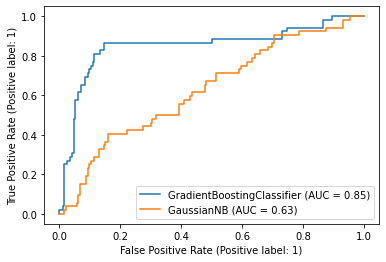

In [246]:
disp = plot_roc_curve(DTC,features_test,target_test)
plot_roc_curve(LGBM,features_test,target_test,ax=disp.ax_)

# Here we choose Classification Model 3 for Hyper Parameter Tuning, Because of GradientBoostingClassifier has better Accuracy score, mean_score, crossval_score and AUC_score

In [247]:
DTC.get_params().keys()

dict_keys(['ccp_alpha', 'criterion', 'init', 'learning_rate', 'loss', 'max_depth', 'max_features', 'max_leaf_nodes', 'min_impurity_decrease', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'n_estimators', 'n_iter_no_change', 'random_state', 'subsample', 'tol', 'validation_fraction', 'verbose', 'warm_start'])

# Hyper Parameter Tuning

In [248]:
from sklearn.model_selection import GridSearchCV

In [249]:
Parameters  = {'ccp_alpha': [0.0000001],
'criterion': ['friedman_mse'],
'learning_rate': [0.6],
'loss': ['exponential'],
'max_depth': [10],
'max_features': [0.70],
'max_leaf_nodes': [35],
'min_impurity_decrease': [0.001],
'min_samples_leaf': [0.04],
'min_samples_split': [0.07],
'min_weight_fraction_leaf': [0.04],
'n_iter_no_change': [39],
'subsample': [0.8],
}

In [250]:
GCV = GridSearchCV(GradientBoostingClassifier(random_state=1),Parameters,cv=5,verbose=0,n_jobs=-1)

In [251]:
GCV.fit(features_train,target_train)

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=1),
             n_jobs=-1,
             param_grid={'ccp_alpha': [1e-07], 'criterion': ['friedman_mse'],
                         'learning_rate': [0.6], 'loss': ['exponential'],
                         'max_depth': [10], 'max_features': [0.7],
                         'max_leaf_nodes': [35],
                         'min_impurity_decrease': [0.001],
                         'min_samples_leaf': [0.04],
                         'min_samples_split': [0.07],
                         'min_weight_fraction_leaf': [0.04],
                         'n_iter_no_change': [39], 'subsample': [0.8]})

In [252]:
PP = GCV.predict(features_test)

In [253]:
Final_scoreACC = accuracy_score(target_test, PP)

In [254]:
Final_scoreF1 = f1_score(target_test, PP, average='micro')

In [255]:
Final_scoreACC

0.8734693877551021

In [256]:
Final_scoreF1

0.8734693877551021

In [257]:
0.8734693877551021 - 0.8693877551020408

0.004081632653061273

# Here we are able to achieve a least amount of increase from 86% to 87% and the differnce is 0.004081632653061273

# Confusion Matrix of the selected Model 3

In [258]:
from sklearn.metrics import confusion_matrix

In [259]:
target_predict = DTC.predict(features_test)

In [260]:
CM = confusion_matrix(target_test, target_predict)

In [261]:
CM

array([[173,  20],
       [ 14,  38]], dtype=int64)

<AxesSubplot:>

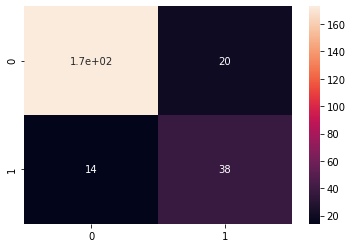

In [262]:
sn.heatmap(CM, annot=True)

* on the Actual values side 0 173 has been predicted correctly

* on the Actual values side 1 39 has been predicted correctly

* on the Predicted values side 0 13 has been not predicted correctly

* on the Predicted values side 1 19 has been not predicted correctly

# Model saving

In [263]:
import pickle
filename = 'Insurance_Fraud.pkl'
pickle.dump(Final_scoreACC, open(filename, 'wb'))

# Conclusion

In [264]:
import numpy as np
a = np.array(target_test)
predicted = np.array(GCV.predict(features_test))
df_conclusion = pd.DataFrame({"Original":a, "Predicted":predicted}, index = range(len(a)))
df_conclusion

,Original,Predicted
0,1,1
1,1,1
2,0,0
3,0,0
4,1,0
5,0,0
6,1,1
7,0,0
8,0,0
9,0,0
